In [31]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import warnings
warnings.filterwarnings('ignore')

# Set style for better visualizations
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)

## Data Loading and Preprocessing 

### Excel Sheet Preprocessing

In [32]:
import pandas as pd

# Load the first few rows of both files to inspect the header structure
flir_df_raw = pd.read_csv('FLIR_groups1and2.csv', header=None, nrows=5)
ici_df_raw = pd.read_csv('ICI_groups1and2.csv', header=None, nrows=5)

print("FLIR Raw Head:")
print(flir_df_raw)
print("\nICI Raw Head:")
print(ici_df_raw)

FLIR Raw Head:
         0    1          2          3          4            5            6    \
0        NaN  NaN   Round 1:        NaN        NaN          NaN          NaN   
1        NaN  NaN        NaN    T_CRmax    T_CLmax        T̅_CR        T̅_CL   
2  SubjectID  NaN  T_offset1  Max1R13_1  Max1L13_1  aveAllR13_1  aveAllL13_1   
3   161117-1  NaN       0.58      34.98      35.36        34.44        34.85   
4   161117-2  NaN       0.83      34.71      34.51        34.46        34.24   

     7          8          9    ...      105      106      107        108  \
0    NaN        NaN        NaN  ...      NaN      NaN      NaN        NaN   
1    NaN        NaN        NaN  ...     T_FL     T_FB     T_FT    T_FEmax   
2  T_RC1  T_RC_Dry1  T_RC_Wet1  ...  T_FHLC4  T_FHBC4  T_FHTC4  T_FH_Max4   
3  34.91      34.91       34.6  ...    33.47    33.69    33.22      34.53   
4  34.68      34.68      34.44  ...     33.7    34.14     33.9      34.53   

          109     110    111        112 1

In [33]:
# Reload with the correct header
flir_df = pd.read_csv('FLIR_groups1and2.csv', header=2)
ici_df = pd.read_csv('ICI_groups1and2.csv', header=2)

# Function to clean the dataframe
def initial_clean(df):
    # Drop columns that are completely empty (often "Unnamed" or separators)
    # First, let's identify columns that are unnamed (pandas names them "Unnamed: ...")
    cols_to_drop = [c for c in df.columns if 'Unnamed' in str(c)]
    df_clean = df.drop(columns=cols_to_drop)
    
    # Also drop columns that are all NaN if any remain (and aren't unnamed)
    df_clean = df_clean.dropna(axis=1, how='all')
    
    # SubjectID should be treated as string to avoid numerical operations
    if 'SubjectID' in df_clean.columns:
        df_clean['SubjectID'] = df_clean['SubjectID'].astype(str)
        
    return df_clean

flir_clean_wide = initial_clean(flir_df)
ici_clean_wide = initial_clean(ici_df)

print("FLIR Clean Wide Info:")
print(flir_clean_wide.info())
print("\nICI Clean Wide Info:")
print(ici_clean_wide.info())

# Show first few rows to verify
print("\nFLIR Head:")
print(flir_clean_wide.head())
print("\nICI Head:")
print(ici_clean_wide.head())

FLIR Clean Wide Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1020 entries, 0 to 1019
Columns: 110 entries, SubjectID to aveOralM
dtypes: float64(109), object(1)
memory usage: 876.7+ KB
None

ICI Clean Wide Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1009 entries, 0 to 1008
Columns: 110 entries, SubjectID to aveOralM
dtypes: float64(109), object(1)
memory usage: 867.2+ KB
None

FLIR Head:
  SubjectID  T_offset1  Max1R13_1  Max1L13_1  aveAllR13_1  aveAllL13_1  T_RC1  \
0  161117-1       0.58      34.98      35.36        34.44        34.85  34.91   
1  161117-2       0.83      34.71      34.51        34.46        34.24  34.68   
2  161117-3       0.85      35.70      35.44        35.00        34.78  35.67   
3  161117-4       0.90      35.17      35.50        34.25        35.00  35.14   
4  161117-5       1.08      35.33      35.55        34.31        35.14  35.50   

   T_RC_Dry1  T_RC_Wet1  T_RC_Max1  ...  T_FHRC4  T_FHLC4  T_FHBC4  T_FHTC4  \
0      34.91      34

In [34]:
import re

def clean_column_names(columns):
    new_columns = []
    for col in columns:
        col_str = str(col)
        
        # Skip id cols
        if col_str in ['SubjectID', 'aveOralM']:
            new_columns.append(col_str)
            continue
            
        # Fix known typo T_LC14 -> T_LC4
        if col_str == 'T_LC14':
            new_columns.append('T_LC_4')
            continue
            
        # Regex to find suffix number 1-4 at the end
        match = re.search(r'^(.*)(_?)([1-4])$', col_str)
        if match:
            stub = match.group(1)
            sep = match.group(2)
            num = match.group(3)
            
            # If separator is missing, add it. If it's already there, keep it.
            # But we want to standardize.
            # Some columns have numeric inside, e.g. Max1R13_1. Stub is Max1R13.
            # Some columns are T_RC1. Stub is T_RC.
            
            # If the original had `_` before the number, strictly speaking we are good.
            # But let's enforce `_` separator.
            new_name = f"{stub}_{num}"
            new_columns.append(new_name)
        else:
            # If no number at end, just keep it? 
            # But wait, are there columns without numbers that aren't ID or aveOralM?
            # Looking at the head, most features have numbers.
            new_columns.append(col_str)
            
    return new_columns

# Apply renaming
flir_clean_wide.columns = clean_column_names(flir_clean_wide.columns)
ici_clean_wide.columns = clean_column_names(ici_clean_wide.columns)

# Reshape to long
def make_long(df):
    # Identify stubs
    # Stubs are the column names without the _1, _2, _3, _4 suffix
    stubs = set()
    for col in df.columns:
        if col not in ['SubjectID', 'aveOralM']:
            stub = col.rsplit('_', 1)[0]
            stubs.add(stub)
            
    stubs = list(stubs)
    
    # We need to make sure we don't have conflicting stubs or columns that don't match the pattern
    # But given our renaming logic, everything not ID/aveOralM should end in _1, _2, _3, _4
    
    try:
        df_long = pd.wide_to_long(df, stubnames=stubs, i=['SubjectID', 'aveOralM'], j='Round', sep='_', suffix='\d+')
        df_long = df_long.reset_index()
        # sort by SubjectID and Round
        df_long = df_long.sort_values(by=['SubjectID', 'Round'])
        return df_long
    except Exception as e:
        print(f"Error reshaping: {e}")
        return df

flir_clean_long = make_long(flir_clean_wide)
ici_clean_long = make_long(ici_clean_wide)

print("FLIR Long Info:")
print(flir_clean_long.info())
print("\nICI Long Info:")
print(ici_clean_long.info())

# Check head
print("\nFLIR Long Head:")
print(flir_clean_long.head())
print("\nICI Long Head:")
print(ici_clean_long.head())

FLIR Long Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4080 entries, 0 to 4079
Data columns (total 30 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   SubjectID   4080 non-null   object 
 1   aveOralM    4080 non-null   float64
 2   Round       4080 non-null   int64  
 3   T_FHC_Max   4013 non-null   float64
 4   T_FH_Max    4013 non-null   float64
 5   canthi4Max  4013 non-null   float64
 6   T_LC        4013 non-null   float64
 7   T_Max       4013 non-null   float64
 8   T_FHRC      4013 non-null   float64
 9   T_RC_Max    4013 non-null   float64
 10  RCC         4013 non-null   float64
 11  T_LC_Dry    4013 non-null   float64
 12  T_LC_Wet    4013 non-null   float64
 13  canthiMax   4013 non-null   float64
 14  T_FHLC      4013 non-null   float64
 15  T_RC_Dry    4013 non-null   float64
 16  aveAllL13   4017 non-null   float64
 17  T_LC_Max    4013 non-null   float64
 18  T_FHCC      4013 non-null   float64
 19  LCC        

In [35]:
flir_clean_wide.to_csv('FLIR_cleaned_wide.csv', index=False)
flir_clean_long.to_csv('FLIR_cleaned_long.csv', index=False)
ici_clean_wide.to_csv('ICI_cleaned_wide.csv', index=False)
ici_clean_long.to_csv('ICI_cleaned_long.csv', index=False)

# List the files
import os
print(os.listdir('.'))

['ICI_cleaned_long.csv', 'FLIR_groups1and2.csv', 'FLIR_cleaned_long.csv', 'venv', 'ICI_cleaned_wide.csv', 'model.ipynb', 'FLIR_cleaned_wide.csv', 'ICI_groups1and2.csv', 'plots']


### Data Loading

In [64]:
# Load the cleaned long-format datasets
flir_df = pd.read_csv('FLIR_cleaned_long.csv')
ici_df = pd.read_csv('ICI_cleaned_long.csv')

### FLIR Data Preprocessing

In [65]:
flir_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4080 entries, 0 to 4079
Data columns (total 30 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   SubjectID   4080 non-null   object 
 1   aveOralM    4080 non-null   float64
 2   Round       4080 non-null   int64  
 3   T_FHC_Max   4013 non-null   float64
 4   T_FH_Max    4013 non-null   float64
 5   canthi4Max  4013 non-null   float64
 6   T_LC        4013 non-null   float64
 7   T_Max       4013 non-null   float64
 8   T_FHRC      4013 non-null   float64
 9   T_RC_Max    4013 non-null   float64
 10  RCC         4013 non-null   float64
 11  T_LC_Dry    4013 non-null   float64
 12  T_LC_Wet    4013 non-null   float64
 13  canthiMax   4013 non-null   float64
 14  T_FHLC      4013 non-null   float64
 15  T_RC_Dry    4013 non-null   float64
 16  aveAllL13   4017 non-null   float64
 17  T_LC_Max    4013 non-null   float64
 18  T_FHCC      4013 non-null   float64
 19  LCC         4013 non-null  

In [66]:
flir_df.isna().sum()

SubjectID      0
aveOralM       0
Round          0
T_FHC_Max     67
T_FH_Max      67
canthi4Max    67
T_LC          67
T_Max         67
T_FHRC        67
T_RC_Max      67
RCC           67
T_LC_Dry      67
T_LC_Wet      67
canthiMax     67
T_FHLC        67
T_RC_Dry      67
aveAllL13     63
T_LC_Max      67
T_FHCC        67
LCC           67
T_offset      67
T_OR_Max      67
T_RC          67
T_FHBC        67
Max1R13       63
T_RC_Wet      67
T_FHTC        67
T_OR          67
aveAllR13     63
Max1L13       63
dtype: int64

In [67]:
# remove NaN rows
flir_df = flir_df.dropna()

In [68]:
flir_df.isna().sum()

SubjectID     0
aveOralM      0
Round         0
T_FHC_Max     0
T_FH_Max      0
canthi4Max    0
T_LC          0
T_Max         0
T_FHRC        0
T_RC_Max      0
RCC           0
T_LC_Dry      0
T_LC_Wet      0
canthiMax     0
T_FHLC        0
T_RC_Dry      0
aveAllL13     0
T_LC_Max      0
T_FHCC        0
LCC           0
T_offset      0
T_OR_Max      0
T_RC          0
T_FHBC        0
Max1R13       0
T_RC_Wet      0
T_FHTC        0
T_OR          0
aveAllR13     0
Max1L13       0
dtype: int64

In [69]:
flir_df.describe()

,aveOralM,Round,T_FHC_Max,T_FH_Max,canthi4Max,T_LC,T_Max,T_FHRC,T_RC_Max,RCC,...,T_offset,T_OR_Max,T_RC,T_FHBC,Max1R13,T_RC_Wet,T_FHTC,T_OR,aveAllR13,Max1L13
count,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,...,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000
mean,37.029061,2.495639,35.093686,35.422352,35.759272,35.642390,36.086222,34.567501,35.691086,35.254909,...,0.969185,35.839666,35.661291,34.488368,35.598034,35.548906,34.578866,35.806925,34.889915,35.613431
std,0.508218,1.115375,0.595919,0.538965,0.541352,0.549703,0.600246,0.706885,0.561577,0.640130,...,0.376712,0.764253,0.561429,0.692087,0.588768,0.583393,0.819092,0.765614,0.778010,0.568748
min,35.540000,1.000000,31.630000,33.080000,33.820000,33.780000,33.850000,29.390000,33.350000,30.270000,...,-0.760000,32.180000,33.340000,30.260000,33.350000,33.300000,27.700000,32.180000,29.950000,30.840000
25%,36.790000,2.000000,34.740000,35.120000,35.420000,35.300000,35.680000,34.190000,35.350000,34.860000,...,0.770000,35.360000,35.320000,34.100000,35.240000,35.200000,34.230000,35.330000,34.470000,35.280000
50%,36.940000,2.000000,35.110000,35.410000,35.690000,35.600000,36.000000,34.610000,35.640000,35.220000,...,0.940000,35.800000,35.610000,34.520000,35.550000,35.500000,34.670000,35.770000,34.940000,35.570000
75%,37.140000,3.000000,35.420000,35.700000,36.010000,35.900000,36.410000,34.980000,35.950000,35.590000,...,1.140000,36.330000,35.920000,34.890000,35.880000,35.830000,35.050000,36.290000,35.330000,35.890000
max,40.340000,4.000000,37.850000,38.050000,38.510000,38.160000,39.680000,37.240000,38.540000,38.320000,...,3.580000,39.680000,38.510000,37.290000,38.540000,38.410000,37.450000,39.630000,37.740000,38.160000


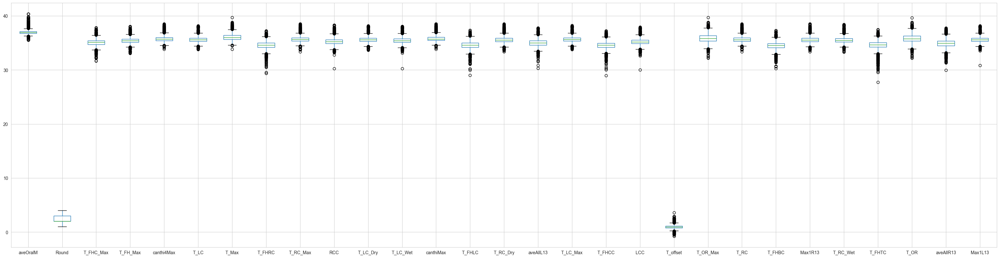

In [70]:
#checking for outliers
flir_df.boxplot(figsize=(40,10))
plt.show()

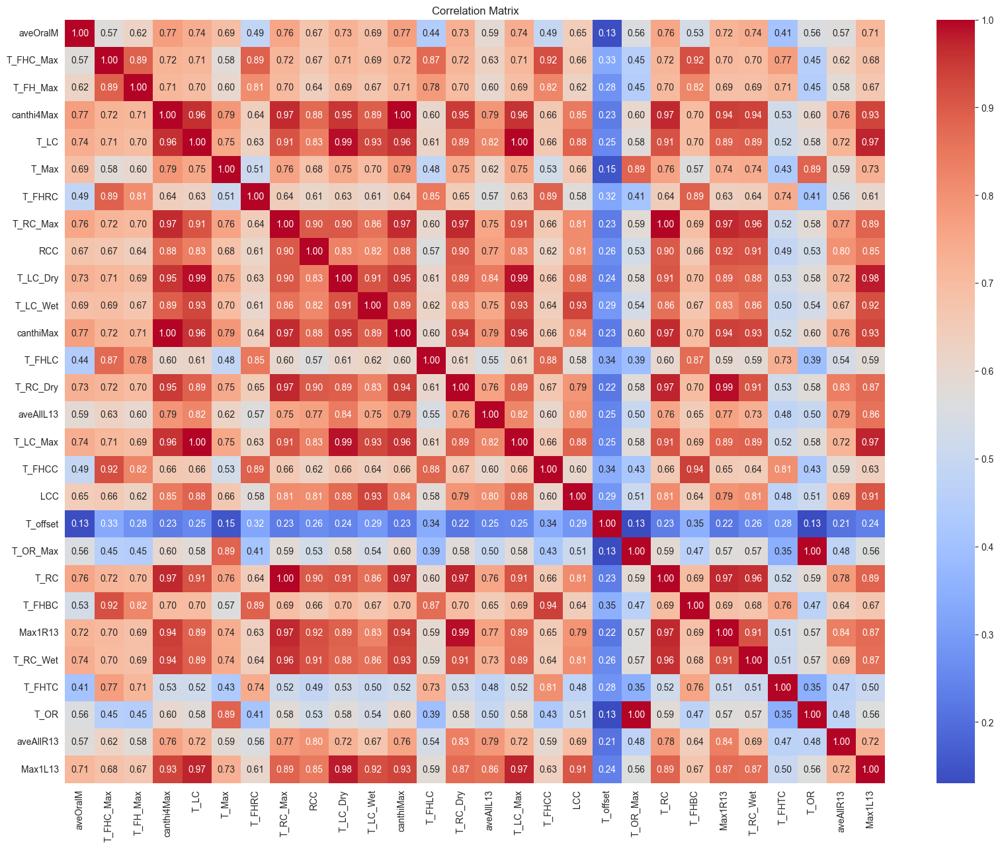

In [71]:
# correlation matrix with target variable and other features excluding SubjectID and Round only diagonal 
correlation_matrix = flir_df.drop(columns=['SubjectID', 'Round']).corr()
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [72]:
# Highest correlated features with aveOralM
target_corr = correlation_matrix['aveOralM'].abs().sort_values(ascending=False)
print("Top correlated features with aveOralM:")
print(target_corr[1:11])  # Exclude aveOralM itself

Top correlated features with aveOralM:
canthi4Max    0.769091
canthiMax     0.768785
T_RC_Max      0.755190
T_RC          0.755066
T_RC_Wet      0.737394
T_LC          0.736433
T_LC_Max      0.736122
T_RC_Dry      0.728759
T_LC_Dry      0.727624
Max1R13       0.720687
Name: aveOralM, dtype: float64


### ICI Data Preprocessing 

In [73]:
ici_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4036 entries, 0 to 4035
Data columns (total 30 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   SubjectID   4036 non-null   object 
 1   aveOralM    4036 non-null   float64
 2   Round       4036 non-null   int64  
 3   T_FHC_Max   3607 non-null   float64
 4   T_FH_Max    3607 non-null   float64
 5   canthi4Max  3606 non-null   float64
 6   T_LC        3607 non-null   float64
 7   T_Max       3607 non-null   float64
 8   T_FHRC      3607 non-null   float64
 9   T_RC_Max    3607 non-null   float64
 10  RCC         3606 non-null   float64
 11  T_LC_Dry    3607 non-null   float64
 12  T_LC_Wet    3607 non-null   float64
 13  canthiMax   3608 non-null   float64
 14  T_FHLC      3607 non-null   float64
 15  T_RC_Dry    3607 non-null   float64
 16  aveAllL13   3612 non-null   float64
 17  T_LC_Max    3607 non-null   float64
 18  T_FHCC      3607 non-null   float64
 19  LCC         3606 non-null  

In [74]:
ici_df.describe()

,aveOralM,Round,T_FHC_Max,T_FH_Max,canthi4Max,T_LC,T_Max,T_FHRC,T_RC_Max,RCC,...,T_offset,T_OR_Max,T_RC,T_FHBC,Max1R13,T_RC_Wet,T_FHTC,T_OR,aveAllR13,Max1L13
count,4036.000000,4036.000000,3607.000000,3607.000000,3606.000000,3607.000000,3607.000000,3607.000000,3607.000000,3606.000000,...,3608.000000,3607.000000,3608.000000,3607.000000,3612.000000,3607.00000,3607.000000,3607.000000,3612.000000,3612.000000
mean,37.030486,2.500000,34.921212,35.282395,35.715682,35.580760,36.093909,34.337291,35.617960,35.133447,...,-0.296627,35.801749,35.586167,34.249412,35.498250,35.43636,34.348658,35.765090,34.672757,35.531512
std,0.510974,1.118173,0.700100,0.645106,0.632029,0.647533,0.702057,0.820716,0.657566,0.754144,...,0.225336,0.890214,0.658513,0.800604,0.703069,0.67885,0.952468,0.891559,0.983690,0.670854
min,35.540000,1.000000,30.800000,32.320000,33.820000,33.130000,34.150000,28.820000,33.020000,30.980000,...,-2.090000,31.590000,32.990000,29.910000,32.470000,31.90000,27.790000,31.570000,30.220000,32.980000
25%,36.790000,1.750000,34.525000,34.930000,35.340000,35.190000,35.610000,33.920000,35.230000,34.672500,...,-0.430000,35.260000,35.200000,33.810000,35.087500,35.05000,33.930000,35.220000,34.150000,35.130000
50%,36.940000,2.500000,34.940000,35.250000,35.640000,35.540000,35.980000,34.390000,35.560000,35.110000,...,-0.310000,35.750000,35.520000,34.280000,35.460000,35.38000,34.440000,35.710000,34.750000,35.490000
75%,37.140000,3.250000,35.300000,35.600000,35.980000,35.870000,36.460000,34.810000,35.910000,35.520000,...,-0.180000,36.350000,35.880000,34.710000,35.830000,35.76000,34.890000,36.310000,35.250000,35.840000
max,40.340000,4.000000,38.360000,38.670000,38.900000,38.820000,39.660000,37.730000,38.960000,38.580000,...,0.660000,39.660000,38.910000,37.870000,38.880000,38.90000,38.120000,39.610000,38.420000,38.860000


In [75]:
ici_df.isna().sum()

SubjectID       0
aveOralM        0
Round           0
T_FHC_Max     429
T_FH_Max      429
canthi4Max    430
T_LC          429
T_Max         429
T_FHRC        429
T_RC_Max      429
RCC           430
T_LC_Dry      429
T_LC_Wet      429
canthiMax     428
T_FHLC        429
T_RC_Dry      429
aveAllL13     424
T_LC_Max      429
T_FHCC        429
LCC           430
T_offset      428
T_OR_Max      429
T_RC          428
T_FHBC        429
Max1R13       424
T_RC_Wet      429
T_FHTC        429
T_OR          429
aveAllR13     424
Max1L13       424
dtype: int64

In [76]:
ici_df = ici_df.dropna()

In [77]:
ici_df.isna().sum()

SubjectID     0
aveOralM      0
Round         0
T_FHC_Max     0
T_FH_Max      0
canthi4Max    0
T_LC          0
T_Max         0
T_FHRC        0
T_RC_Max      0
RCC           0
T_LC_Dry      0
T_LC_Wet      0
canthiMax     0
T_FHLC        0
T_RC_Dry      0
aveAllL13     0
T_LC_Max      0
T_FHCC        0
LCC           0
T_offset      0
T_OR_Max      0
T_RC          0
T_FHBC        0
Max1R13       0
T_RC_Wet      0
T_FHTC        0
T_OR          0
aveAllR13     0
Max1L13       0
dtype: int64

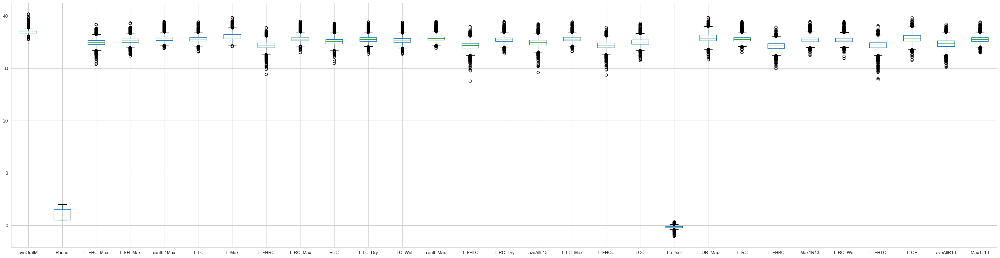

In [78]:
#checking for outliers
ici_df.boxplot(figsize=(40,10))
plt.show()

In [79]:
# remove rows with missing target variable aveOralM
flir_df = flir_df.dropna(subset=['aveOralM'])
ici_df = ici_df.dropna(subset=['aveOralM'])

ici_df.info()
flir_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3604 entries, 0 to 4035
Data columns (total 30 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   SubjectID   3604 non-null   object 
 1   aveOralM    3604 non-null   float64
 2   Round       3604 non-null   int64  
 3   T_FHC_Max   3604 non-null   float64
 4   T_FH_Max    3604 non-null   float64
 5   canthi4Max  3604 non-null   float64
 6   T_LC        3604 non-null   float64
 7   T_Max       3604 non-null   float64
 8   T_FHRC      3604 non-null   float64
 9   T_RC_Max    3604 non-null   float64
 10  RCC         3604 non-null   float64
 11  T_LC_Dry    3604 non-null   float64
 12  T_LC_Wet    3604 non-null   float64
 13  canthiMax   3604 non-null   float64
 14  T_FHLC      3604 non-null   float64
 15  T_RC_Dry    3604 non-null   float64
 16  aveAllL13   3604 non-null   float64
 17  T_LC_Max    3604 non-null   float64
 18  T_FHCC      3604 non-null   float64
 19  LCC         3604 non-null   floa

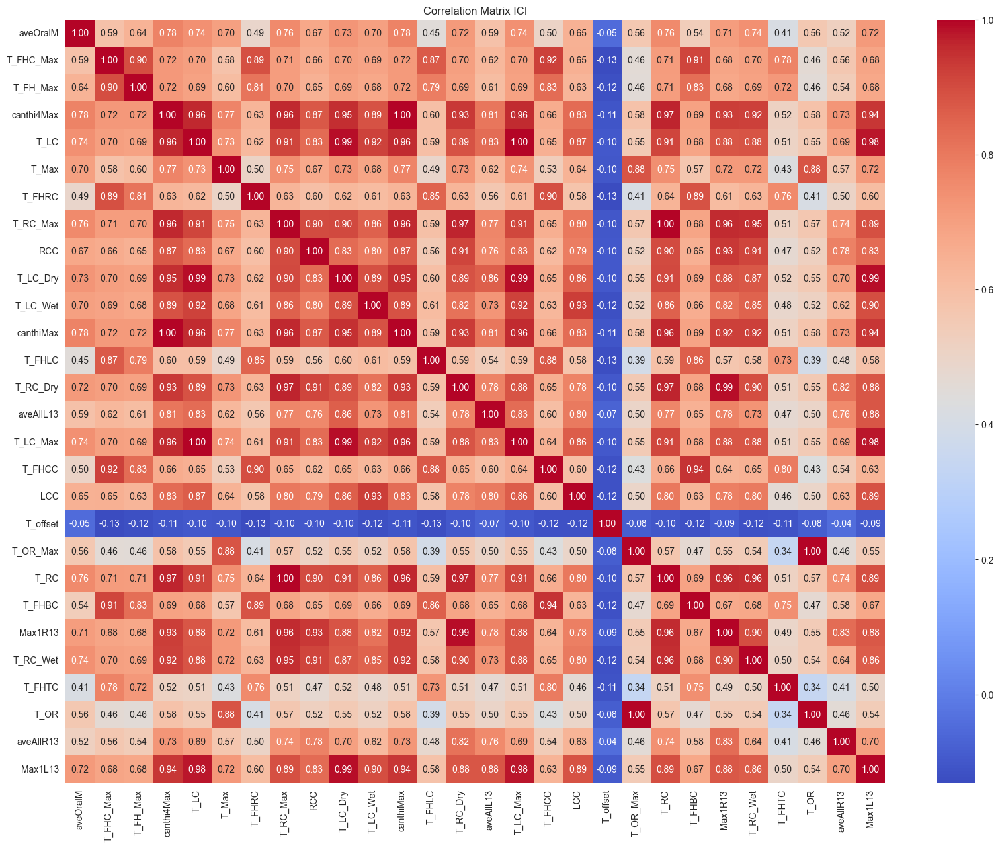

In [81]:
# correlation matrix with target variable and other features excluding SubjectID and Round only diagonal 
correlation_matrix_ici = ici_df.drop(columns=['SubjectID', 'Round']).corr()
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix_ici, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix ICI')
plt.show()

In [82]:
# Top correlated features with aveOralM in ICI
target_corr_ici = correlation_matrix_ici['aveOralM'].abs().sort_values(ascending=False)
print("Top correlated features with aveOralM in ICI:")
print(target_corr_ici[1:11])  # Exclude aveOralM itself

Top correlated features with aveOralM in ICI:
canthi4Max    0.778412
canthiMax     0.777525
T_RC          0.758744
T_RC_Max      0.758095
T_LC          0.742820
T_LC_Max      0.742568
T_RC_Wet      0.740362
T_LC_Dry      0.727373
T_RC_Dry      0.716698
Max1L13       0.715918
Name: aveOralM, dtype: float64


## Model Training

In [95]:
# Create a model with only these top features
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error

drop_cols = ['SubjectID', 'aveOralM', 'Round']

# FLIR Model
X = flir_df.drop(columns=drop_cols)
y = flir_df['aveOralM']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Train a Random Forest Regressor
model = RandomForestRegressor(n_estimators=120, random_state=22)
model.fit(X_train, y_train)
# Evaluate the model
y_pred = model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
accuracy = model.score(X_test, y_test)

# ICI Model
X_ici = ici_df.drop(columns=drop_cols)
y_ici = ici_df['aveOralM']

X_train_ici, X_test_ici, y_train_ici, y_test_ici = train_test_split(X_ici, y_ici, test_size=0.1, random_state=12)

model_ici = RandomForestRegressor(n_estimators=100, random_state=12)
model_ici.fit(X_train_ici, y_train_ici)
y_pred_ici = model_ici.predict(X_test_ici)
mae_ici = mean_absolute_error(y_test_ici, y_pred_ici)
rmse_ici = np.sqrt(mean_squared_error(y_test_ici, y_pred_ici))
accuracy_ici = model_ici.score(X_test_ici, y_test_ici)

print(f"FLIR --> MAE: {mae:.2f}, RMSE: {rmse:.2f}, Accuracy: {accuracy:.2f}")
print(f"ICI --> MAE: {mae_ici:.2f}, RMSE: {rmse_ici:.2f}, Accuracy: {accuracy_ici:.2f}")

FLIR --> MAE: 0.20, RMSE: 0.27, Accuracy: 0.76
ICI --> MAE: 0.19, RMSE: 0.24, Accuracy: 0.73


In [96]:
# Add this cell after your imports
def calculate_mape(y_true, y_pred):
    """
    Calculate Mean Absolute Percentage Error
    MAPE = (1/n) * Σ|((y_true - y_pred) / y_true)| * 100
    """
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [97]:
# Replace your existing model comparison cell with this enhanced version
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR

# Compare models for both cameras with MAPE
comparison_data = []
cameras = {'FLIR': flir_df, 'ICI': ici_df}
model_names = ['Random Forest', 'Linear Regression', 'Decision Tree', 'Support Vector Regressor']

# Store predictions for later visualizations
predictions_storage = {}

for cam, df in cameras.items():
    X = df.drop(columns=drop_cols)
    y = df['aveOralM']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    predictions_storage[cam] = {'X_test': X_test, 'y_test': y_test, 'models': {}}
    
    for model_name in model_names:
        if model_name == 'Random Forest':
            model = RandomForestRegressor(n_estimators=100, random_state=22)
        elif model_name == 'Linear Regression':
            model = LinearRegression()
        elif model_name == 'Decision Tree':
            model = DecisionTreeRegressor(random_state=42)
        elif model_name == 'Support Vector Regressor':
            model = SVR()
        
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        
        # Calculate all metrics
        mae = mean_absolute_error(y_test, y_pred)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        r2 = model.score(X_test, y_test)
        mape = calculate_mape(y_test, y_pred)
        
        # Store predictions and model
        predictions_storage[cam]['models'][model_name] = {
            'model': model,
            'y_pred': y_pred,
            'mae': mae,
            'rmse': rmse,
            'r2': r2,
            'mape': mape
        }
        
        comparison_data.append({
            'Camera': cam,
            'Model': model_name,
            'MAE': mae,
            'RMSE': rmse,
            'R²': r2,
            'MAPE': mape
        })

# Display comparison results
comparison_df = pd.DataFrame(comparison_data)
print("\n" + "="*80)
print("MODEL PERFORMANCE COMPARISON")
print("="*80)
print(comparison_df.to_string(index=False))


MODEL PERFORMANCE COMPARISON
Camera                    Model      MAE     RMSE       R²     MAPE
  FLIR            Random Forest 0.194009 0.262875 0.751915 0.523835
  FLIR        Linear Regression 0.237577 0.312126 0.650248 0.640755
  FLIR            Decision Tree 0.252864 0.355402 0.546537 0.682372
  FLIR Support Vector Regressor 0.222071 0.296618 0.684139 0.598929
   ICI            Random Forest 0.192436 0.250979 0.733009 0.519168
   ICI        Linear Regression 0.220950 0.282038 0.662837 0.595981
   ICI            Decision Tree 0.271290 0.359515 0.452154 0.732406
   ICI Support Vector Regressor 0.205671 0.264399 0.703693 0.554484



Training Ensemble Models for FLIR Camera
Gradient Boosting - MAE: 0.2084, RMSE: 0.2793, R²: 0.7200
AdaBoost - MAE: 0.2287, RMSE: 0.2979, R²: 0.6813

Training Ensemble Models for ICI Camera
Gradient Boosting - MAE: 0.1992, RMSE: 0.2544, R²: 0.7257
AdaBoost - MAE: 0.2181, RMSE: 0.2779, R²: 0.6727

COMPLETE MODEL COMPARISON
Camera                    Model      MAE     RMSE       R²     MAPE
  FLIR            Random Forest 0.194009 0.262875 0.751915 0.523835
  FLIR        Linear Regression 0.237577 0.312126 0.650248 0.640755
  FLIR            Decision Tree 0.252864 0.355402 0.546537 0.682372
  FLIR Support Vector Regressor 0.222071 0.296618 0.684139 0.598929
   ICI            Random Forest 0.192436 0.250979 0.733009 0.519168
   ICI        Linear Regression 0.220950 0.282038 0.662837 0.595981
   ICI            Decision Tree 0.271290 0.359515 0.452154 0.732406
   ICI Support Vector Regressor 0.205671 0.264399 0.703693 0.554484
  FLIR        Gradient Boosting 0.208429 0.279293 0.719959      

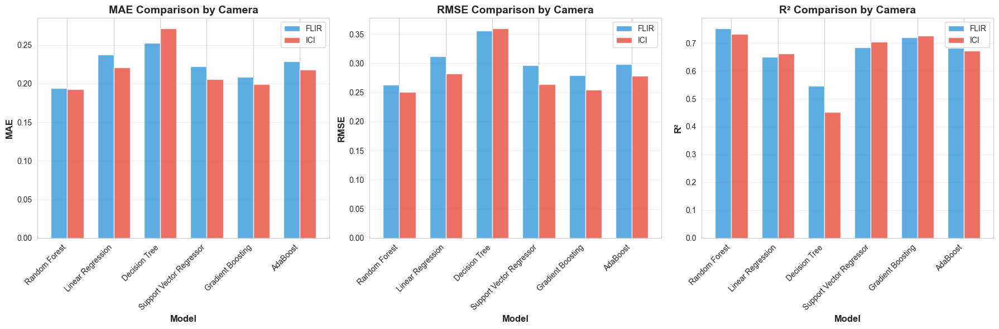

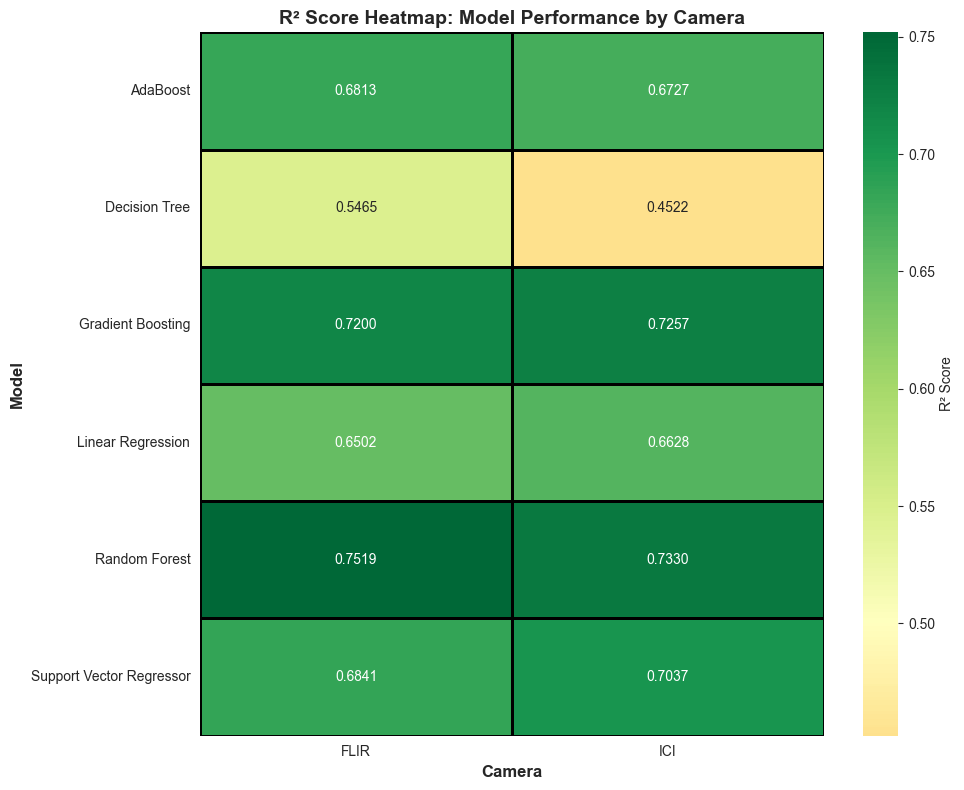


SUMMARY STATISTICS BY CAMERA
             MAE                                    RMSE                      \
            mean       std       min       max      mean       std       min   
Camera                                                                         
FLIR    0.223946  0.020907  0.194009  0.252864  0.300708  0.031737  0.262875   
ICI     0.217954  0.028306  0.192436  0.271290  0.281529  0.040149  0.250979   

                        R²                                
             max      mean       std       min       max  
Camera                                                    
FLIR    0.355402  0.672355  0.070900  0.546537  0.751915  
ICI     0.359515  0.658359  0.104799  0.452154  0.733009  

BEST PERFORMING MODELS

FLIR Camera:
  Best Model: Random Forest
  R²: 0.7519
  MAE: 0.1940
  RMSE: 0.2629

ICI Camera:
  Best Model: Random Forest
  R²: 0.7330
  MAE: 0.1924
  RMSE: 0.2510


In [98]:
# Trying Ensemble Methods - Compare across both cameras
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor

ensemble_models = {
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42),
    'AdaBoost': AdaBoostRegressor(n_estimators=100, random_state=42)
}

# Run ensemble models for both cameras
for cam, df in cameras.items():
    X = df.drop(columns=drop_cols)
    y = df['aveOralM']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    print(f"\n{'='*60}")
    print(f"Training Ensemble Models for {cam} Camera")
    print(f"{'='*60}")
    
    for model_name, model in ensemble_models.items():
        # Clone the model to avoid fitting the same instance
        if model_name == 'Gradient Boosting':
            model = GradientBoostingRegressor(n_estimators=100, random_state=42)
        else:
            model = AdaBoostRegressor(n_estimators=100, random_state=42)
        
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        mae = mean_absolute_error(y_test, y_pred)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        accuracy = model.score(X_test, y_test)
        
        print(f"{model_name} - MAE: {mae:.4f}, RMSE: {rmse:.4f}, R²: {accuracy:.4f}")
        
        # Add to comparison dataframe
        new_row = pd.DataFrame([{
            'Camera': cam, 
            'Model': model_name, 
            'MAE': mae, 
            'RMSE': rmse, 
            'R²': accuracy
        }])
        comparison_df = pd.concat([comparison_df, new_row], ignore_index=True)

# Display complete comparison
print("\n" + "="*80)
print("COMPLETE MODEL COMPARISON")
print("="*80)
print(comparison_df.to_string(index=False))

# Create separate plots for each metric
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

metrics = ['MAE', 'RMSE', 'R²']
colors = {'FLIR': '#3498db', 'ICI': '#e74c3c'}

for idx, metric in enumerate(metrics):
    ax = axes[idx]
    
    # Prepare data for this metric
    plot_data = comparison_df[['Camera', 'Model', metric]].copy()
    
    # Create grouped bar chart
    x = np.arange(len(comparison_df['Model'].unique()))
    width = 0.35
    
    flir_data = plot_data[plot_data['Camera'] == 'FLIR']
    ici_data = plot_data[plot_data['Camera'] == 'ICI']
    
    ax.bar(x - width/2, flir_data[metric].values, width, label='FLIR', color=colors['FLIR'], alpha=0.8)
    ax.bar(x + width/2, ici_data[metric].values, width, label='ICI', color=colors['ICI'], alpha=0.8)
    
    ax.set_xlabel('Model', fontsize=12, fontweight='bold')
    ax.set_ylabel(metric, fontsize=12, fontweight='bold')
    ax.set_title(f'{metric} Comparison by Camera', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(flir_data['Model'].unique(), rotation=45, ha='right')
    ax.legend()
    ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('model_comparison_by_camera.png', dpi=300, bbox_inches='tight')
plt.show()

# Create a heatmap for R² scores
pivot_r2 = comparison_df.pivot(index='Model', columns='Camera', values='R²')
plt.figure(figsize=(10, 8))
sns.heatmap(pivot_r2, annot=True, fmt='.4f', cmap='RdYlGn', center=0.5, 
            cbar_kws={'label': 'R² Score'}, linewidths=1, linecolor='black')
plt.title('R² Score Heatmap: Model Performance by Camera', fontsize=14, fontweight='bold')
plt.ylabel('Model', fontsize=12, fontweight='bold')
plt.xlabel('Camera', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('r2_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

# Summary statistics
print("\n" + "="*80)
print("SUMMARY STATISTICS BY CAMERA")
print("="*80)
summary = comparison_df.groupby('Camera')[['MAE', 'RMSE', 'R²']].agg(['mean', 'std', 'min', 'max'])
print(summary)

# Best model for each camera
print("\n" + "="*80)
print("BEST PERFORMING MODELS")
print("="*80)
for cam in ['FLIR', 'ICI']:
    cam_data = comparison_df[comparison_df['Camera'] == cam]
    best_model = cam_data.loc[cam_data['R²'].idxmax()]
    print(f"\n{cam} Camera:")
    print(f"  Best Model: {best_model['Model']}")
    print(f"  R²: {best_model['R²']:.4f}")
    print(f"  MAE: {best_model['MAE']:.4f}")
    print(f"  RMSE: {best_model['RMSE']:.4f}")

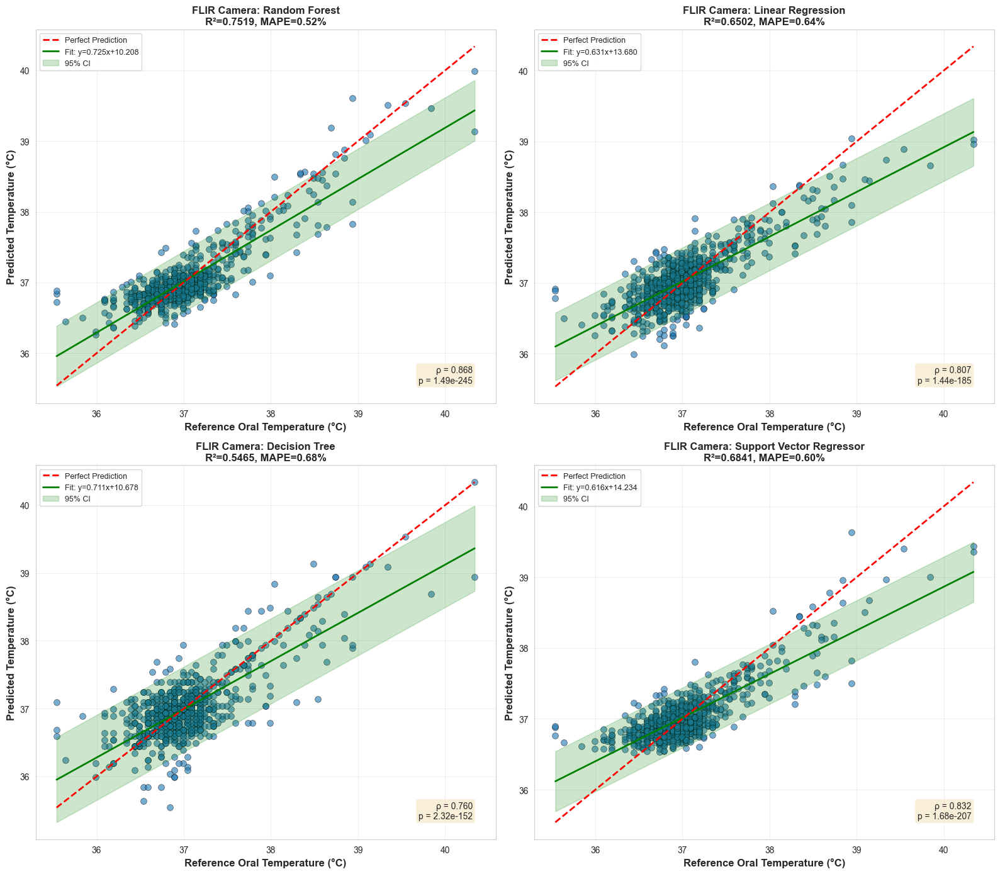

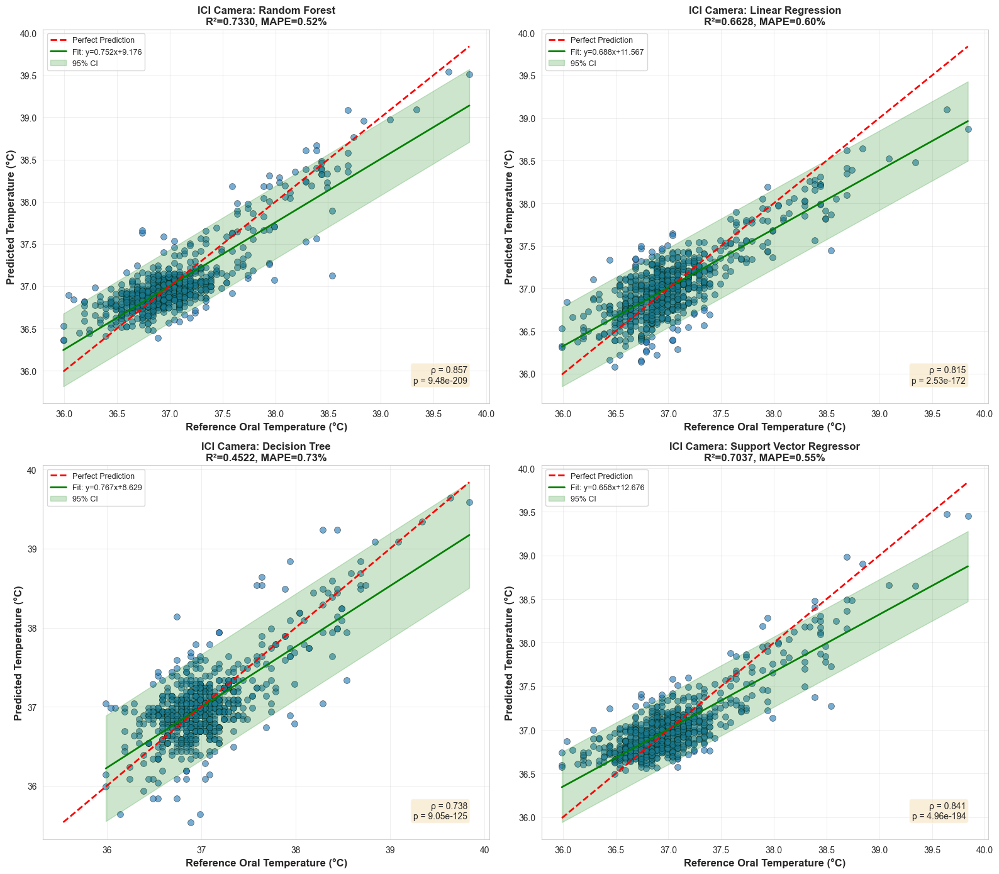

In [99]:
# Calibration Scatter Plots with confidence intervals
from scipy import stats as sp_stats

def plot_calibration_curves(predictions_storage, cameras):
    """
    Create calibration scatter plots with regression lines and confidence intervals
    """
    n_models = len(model_names)
    
    for cam in cameras.keys():
        fig, axes = plt.subplots(2, 2, figsize=(16, 14))
        axes = axes.flatten()
        
        y_test = predictions_storage[cam]['y_test']
        
        for idx, model_name in enumerate(model_names):
            ax = axes[idx]
            y_pred = predictions_storage[cam]['models'][model_name]['y_pred']
            r2 = predictions_storage[cam]['models'][model_name]['r2']
            mape = predictions_storage[cam]['models'][model_name]['mape']
            
            # Scatter plot
            ax.scatter(y_test, y_pred, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
            
            # Perfect prediction line (y=x)
            min_val = min(y_test.min(), y_pred.min())
            max_val = max(y_test.max(), y_pred.max())
            ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, 
                   label='Perfect Prediction', zorder=10)
            
            # Regression line with confidence interval
            slope, intercept, r_value, p_value, std_err = sp_stats.linregress(y_test, y_pred)
            line = slope * y_test + intercept
            
            # Sort for proper plotting
            sorted_indices = np.argsort(y_test)
            y_test_sorted = np.array(y_test)[sorted_indices]
            line_sorted = line.values[sorted_indices] if hasattr(line, 'values') else line[sorted_indices]
            
            ax.plot(y_test_sorted, line_sorted, 'g-', lw=2, 
                   label=f'Fit: y={slope:.3f}x+{intercept:.3f}')
            
            # Calculate 95% confidence interval
            predict_error = y_pred - line
            predict_std = np.std(predict_error)
            confidence_interval = 1.96 * predict_std
            
            ax.fill_between(y_test_sorted, 
                          line_sorted - confidence_interval,
                          line_sorted + confidence_interval,
                          alpha=0.2, color='green', label='95% CI')
            
            # Labels and title
            ax.set_xlabel('Reference Oral Temperature (°C)', fontsize=12, fontweight='bold')
            ax.set_ylabel('Predicted Temperature (°C)', fontsize=12, fontweight='bold')
            ax.set_title(f'{cam} Camera: {model_name}\nR²={r2:.4f}, MAPE={mape:.2f}%', 
                        fontsize=12, fontweight='bold')
            ax.legend(loc='upper left', fontsize=9)
            ax.grid(True, alpha=0.3)
            
            # Add correlation text
            ax.text(0.95, 0.05, f'ρ = {r_value:.3f}\np = {p_value:.2e}',
                   transform=ax.transAxes, fontsize=10,
                   verticalalignment='bottom', horizontalalignment='right',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
        
        plt.tight_layout()
        plt.savefig(f'{cam}_calibration_curves.png', dpi=300, bbox_inches='tight')
        plt.show()

# Generate calibration plots
plot_calibration_curves(predictions_storage, cameras)

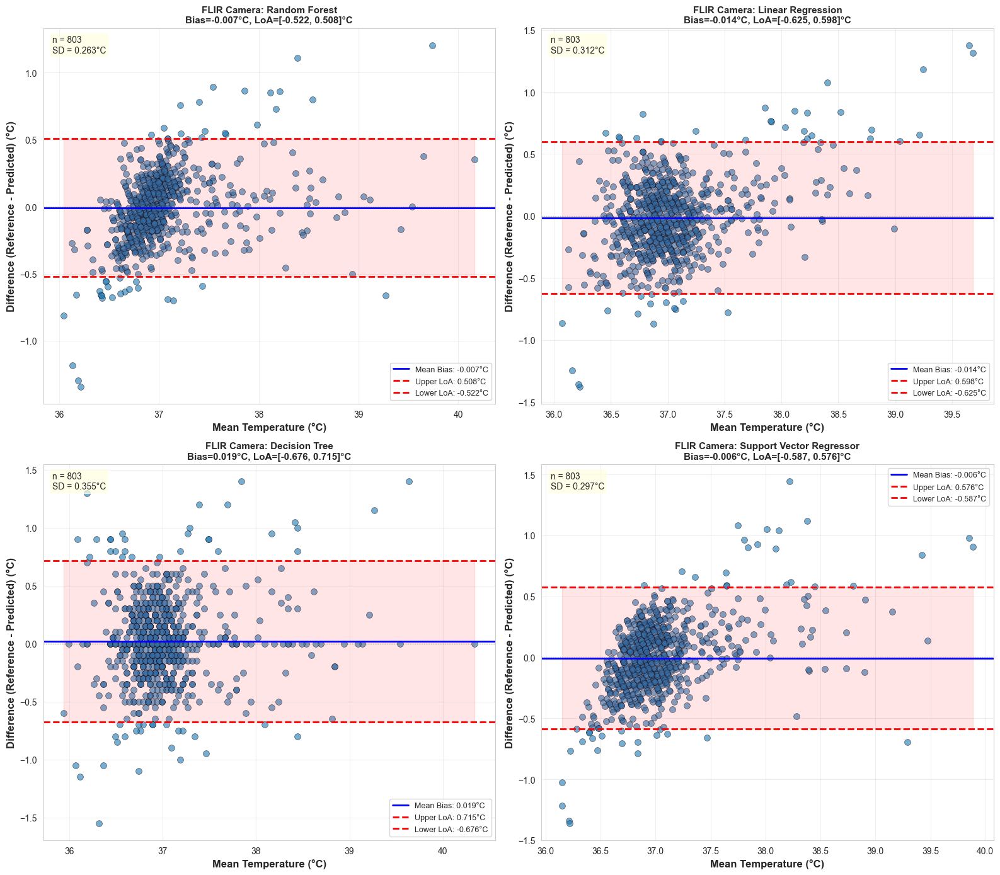

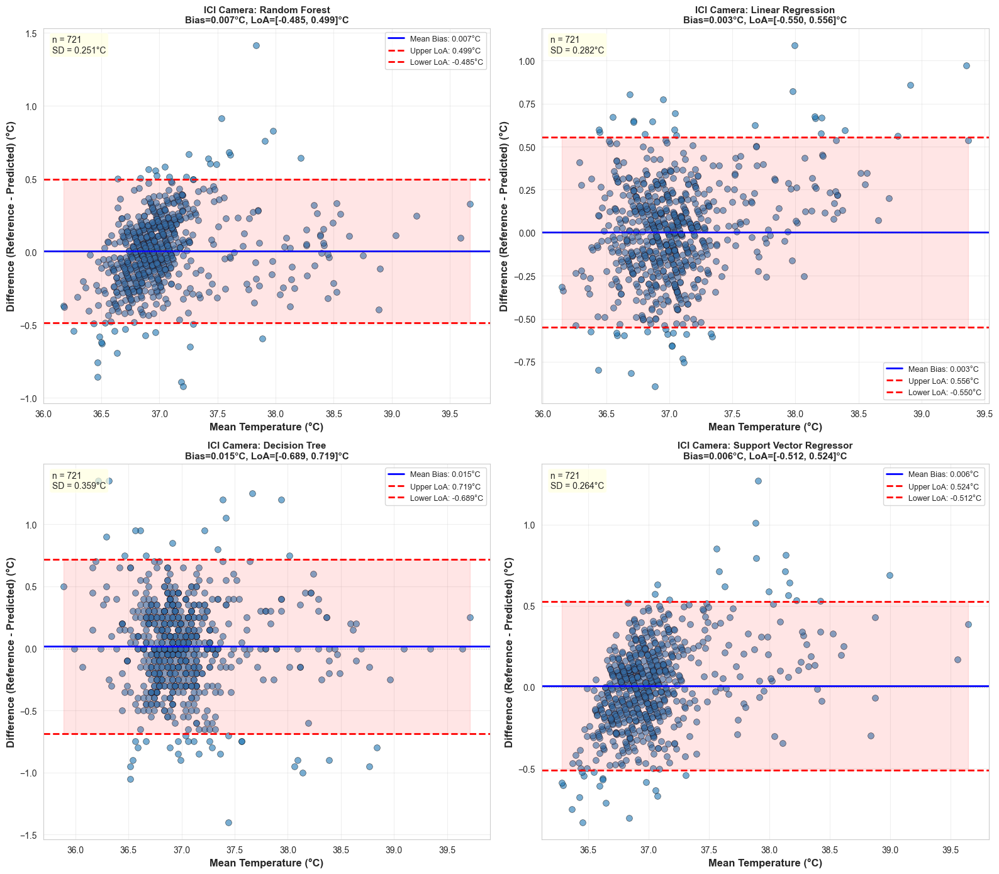

In [100]:
# Bland-Altman Plots
def plot_bland_altman(predictions_storage, cameras):
    """
    Create Bland-Altman plots to visualize agreement and bias
    """
    for cam in cameras.keys():
        fig, axes = plt.subplots(2, 2, figsize=(16, 14))
        axes = axes.flatten()
        
        y_test = predictions_storage[cam]['y_test']
        
        for idx, model_name in enumerate(model_names):
            ax = axes[idx]
            y_pred = predictions_storage[cam]['models'][model_name]['y_pred']
            
            # Calculate mean and difference
            mean_temp = (y_test + y_pred) / 2
            diff = y_test - y_pred
            
            mean_diff = np.mean(diff)
            std_diff = np.std(diff)
            
            # Scatter plot
            ax.scatter(mean_temp, diff, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
            
            # Mean bias line
            ax.axhline(mean_diff, color='blue', linestyle='-', lw=2, 
                      label=f'Mean Bias: {mean_diff:.3f}°C')
            
            # Limits of agreement (±1.96 SD)
            upper_loa = mean_diff + 1.96 * std_diff
            lower_loa = mean_diff - 1.96 * std_diff
            
            ax.axhline(upper_loa, color='red', linestyle='--', lw=2, 
                      label=f'Upper LoA: {upper_loa:.3f}°C')
            ax.axhline(lower_loa, color='red', linestyle='--', lw=2, 
                      label=f'Lower LoA: {lower_loa:.3f}°C')
            
            # Shaded region between limits
            ax.fill_between([mean_temp.min(), mean_temp.max()], 
                          lower_loa, upper_loa, alpha=0.1, color='red')
            
            # Zero line
            ax.axhline(0, color='gray', linestyle=':', lw=1, alpha=0.5)
            
            # Labels
            ax.set_xlabel('Mean Temperature (°C)', fontsize=12, fontweight='bold')
            ax.set_ylabel('Difference (Reference - Predicted) (°C)', fontsize=12, fontweight='bold')
            ax.set_title(f'{cam} Camera: {model_name}\nBias={mean_diff:.3f}°C, LoA=[{lower_loa:.3f}, {upper_loa:.3f}]°C',
                        fontsize=11, fontweight='bold')
            ax.legend(loc='best', fontsize=9)
            ax.grid(True, alpha=0.3)
            
            # Add statistics box
            stats_text = f'n = {len(diff)}\nSD = {std_diff:.3f}°C'
            ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, 
                   fontsize=10, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.7))
        
        plt.tight_layout()
        plt.savefig(f'{cam}_bland_altman_plots.png', dpi=300, bbox_inches='tight')
        plt.show()

# Generate Bland-Altman plots
plot_bland_altman(predictions_storage, cameras)

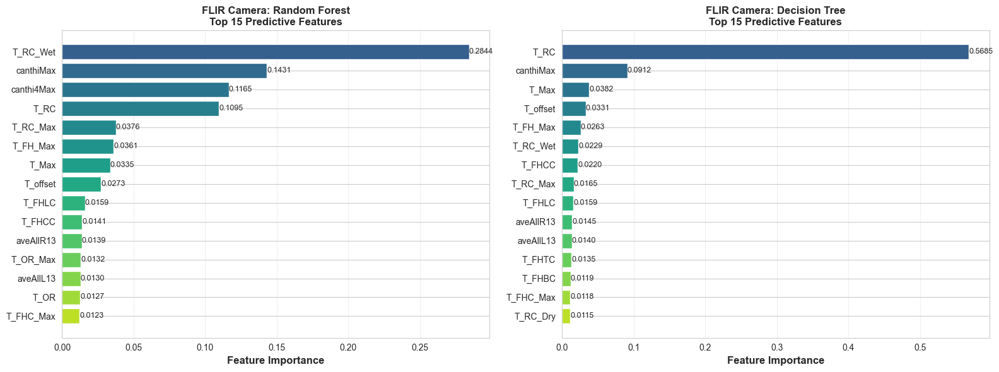

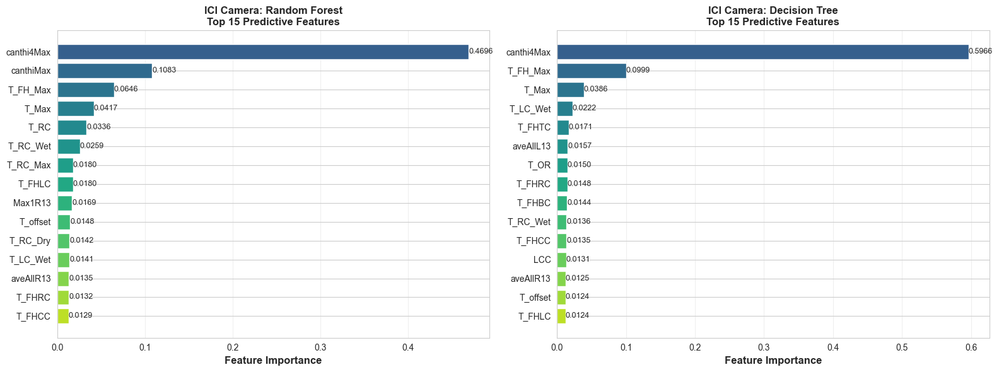

In [25]:
# Feature Importance Analysis
def plot_feature_importance(predictions_storage, cameras):
    """
    Plot feature importance for tree-based models
    """
    tree_models = ['Random Forest', 'Decision Tree']
    feature_names = predictions_storage['FLIR']['X_test'].columns
    
    for cam in cameras.keys():
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        
        for idx, model_name in enumerate(tree_models):
            ax = axes[idx]
            model = predictions_storage[cam]['models'][model_name]['model']
            
            # Get feature importances
            importances = model.feature_importances_
            
            # Sort features by importance
            indices = np.argsort(importances)[::-1][:15]  # Top 15 features
            
            # Create DataFrame for plotting
            importance_df = pd.DataFrame({
                'Feature': [feature_names[i] for i in indices],
                'Importance': importances[indices]
            })
            
            # Horizontal bar plot
            colors = plt.cm.viridis(np.linspace(0.3, 0.9, len(indices)))
            bars = ax.barh(range(len(indices)), importance_df['Importance'], color=colors)
            
            ax.set_yticks(range(len(indices)))
            ax.set_yticklabels(importance_df['Feature'])
            ax.set_xlabel('Feature Importance', fontsize=12, fontweight='bold')
            ax.set_title(f'{cam} Camera: {model_name}\nTop 15 Predictive Features', 
                        fontsize=12, fontweight='bold')
            ax.invert_yaxis()
            ax.grid(True, alpha=0.3, axis='x')
            
            # Add value labels on bars
            for i, bar in enumerate(bars):
                width = bar.get_width()
                ax.text(width, bar.get_y() + bar.get_height()/2, 
                       f'{width:.4f}', ha='left', va='center', fontsize=9)
        
        plt.tight_layout()
        plt.savefig(f'{cam}_feature_importance.png', dpi=300, bbox_inches='tight')
        plt.show()

# Generate feature importance plots
plot_feature_importance(predictions_storage, cameras)

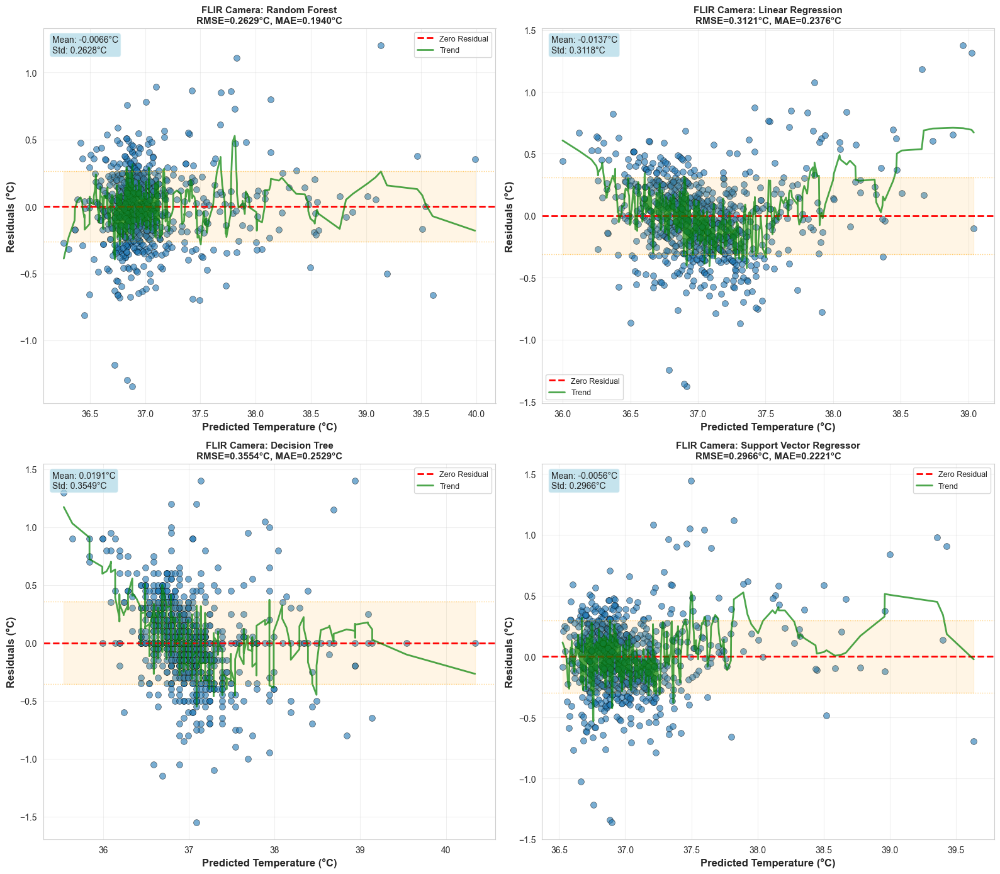

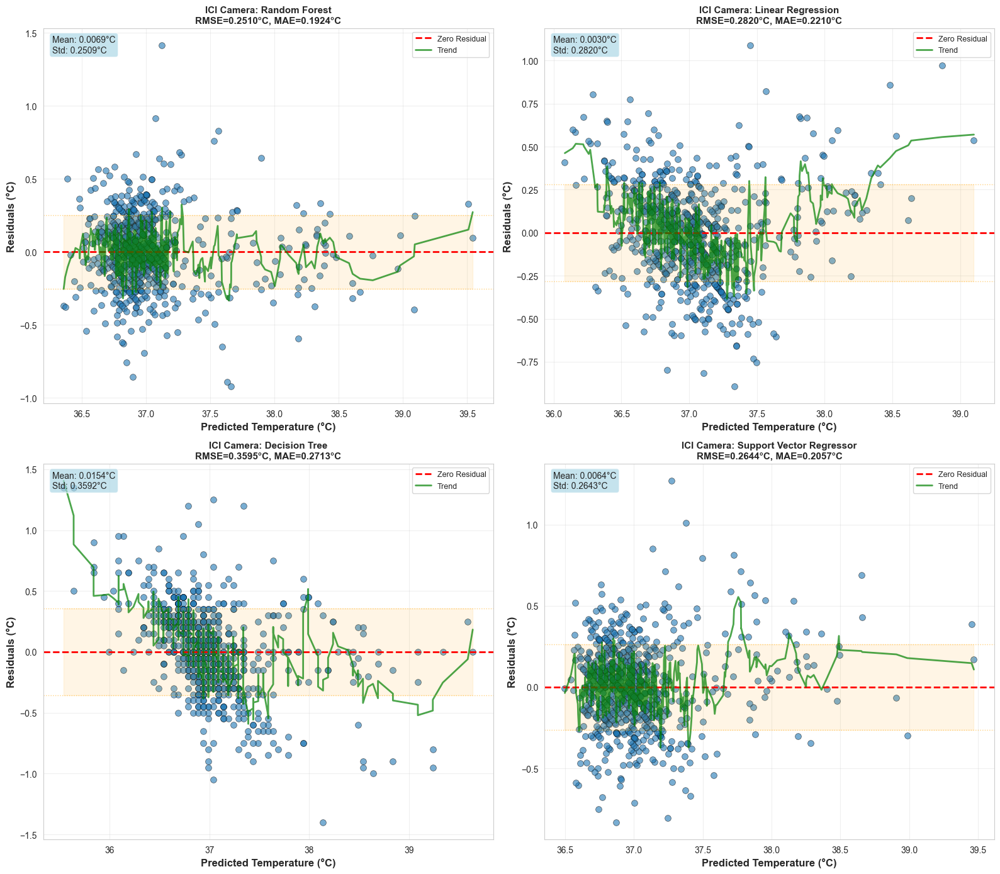

In [26]:
# Residual Plots across temperature range
def plot_residuals(predictions_storage, cameras):
    """
    Create residual plots to assess model performance across temperature range
    """
    for cam in cameras.keys():
        fig, axes = plt.subplots(2, 2, figsize=(16, 14))
        axes = axes.flatten()
        
        y_test = predictions_storage[cam]['y_test']
        
        for idx, model_name in enumerate(model_names):
            ax = axes[idx]
            y_pred = predictions_storage[cam]['models'][model_name]['y_pred']
            residuals = y_test - y_pred
            
            # Scatter plot of residuals
            ax.scatter(y_pred, residuals, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
            
            # Zero line
            ax.axhline(0, color='red', linestyle='--', lw=2, label='Zero Residual')
            
            # Add smoothed trend line using LOWESS
            from scipy.signal import savgol_filter
            sorted_indices = np.argsort(y_pred)
            y_pred_sorted = y_pred[sorted_indices]
            residuals_sorted = residuals.values[sorted_indices] if hasattr(residuals, 'values') else residuals[sorted_indices]
            
            # Apply Savitzky-Golay filter for smooth trend
            if len(residuals_sorted) > 11:
                trend = savgol_filter(residuals_sorted, window_length=11, polyorder=2)
                ax.plot(y_pred_sorted, trend, 'g-', lw=2, label='Trend', alpha=0.7)
            
            # Calculate residual statistics
            rmse = np.sqrt(np.mean(residuals**2))
            mae = np.mean(np.abs(residuals))
            
            # Labels
            ax.set_xlabel('Predicted Temperature (°C)', fontsize=12, fontweight='bold')
            ax.set_ylabel('Residuals (°C)', fontsize=12, fontweight='bold')
            ax.set_title(f'{cam} Camera: {model_name}\nRMSE={rmse:.4f}°C, MAE={mae:.4f}°C',
                        fontsize=11, fontweight='bold')
            ax.legend(loc='best', fontsize=9)
            ax.grid(True, alpha=0.3)
            
            # Add standard deviation bands
            std_residuals = np.std(residuals)
            ax.axhline(std_residuals, color='orange', linestyle=':', lw=1, alpha=0.5)
            ax.axhline(-std_residuals, color='orange', linestyle=':', lw=1, alpha=0.5)
            ax.fill_between([y_pred.min(), y_pred.max()], 
                          -std_residuals, std_residuals, alpha=0.1, color='orange')
            
            # Statistics box
            stats_text = f'Mean: {np.mean(residuals):.4f}°C\nStd: {std_residuals:.4f}°C'
            ax.text(0.02, 0.98, stats_text, transform=ax.transAxes,
                   fontsize=10, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.7))
        
        plt.tight_layout()
        plt.savefig(f'{cam}_residual_plots.png', dpi=300, bbox_inches='tight')
        plt.show()

# Generate residual plots
plot_residuals(predictions_storage, cameras)

In [ ]:
# Comprehensive Accuracy Assessment Report
def generate_accuracy_report(comparison_df, cameras):
    """
    Generate detailed accuracy assessment report
    """
    print("\n" + "="*100)
    print(" " * 35 + "COMPREHENSIVE ACCURACY ASSESSMENT REPORT")
    print("="*100)
    
    # Overall statistics by camera
    print("\n1. OVERALL PERFORMANCE BY CAMERA:")
    print("-" * 100)
    summary_stats = comparison_df.groupby('Camera')[['MAE', 'RMSE', 'R²', 'MAPE']].agg(['mean', 'std', 'min', 'max'])
    print(summary_stats)
    
    # Best performing models
    print("\n2. BEST PERFORMING MODELS:")
    print("-" * 100)
    for cam in cameras.keys():
        cam_data = comparison_df[comparison_df['Camera'] == cam]
        
        # Best by R²
        best_r2 = cam_data.loc[cam_data['R²'].idxmax()]
        # Best by MAPE (lowest)
        best_mape = cam_data.loc[cam_data['MAPE'].idxmin()]
        # Best by MAE (lowest)
        best_mae = cam_data.loc[cam_data['MAE'].idxmin()]
        
        print(f"\n{cam} Camera:")
        print(f"  Highest R²:       {best_r2['Model']:<25} (R²={best_r2['R²']:.4f})")
        print(f"  Lowest MAPE:      {best_mape['Model']:<25} (MAPE={best_mape['MAPE']:.2f}%)")
        print(f"  Lowest MAE:       {best_mae['Model']:<25} (MAE={best_mae['MAE']:.4f}°C)")
    
    # Camera comparison
    print("\n3. CAMERA COMPARISON:")
    print("-" * 100)
    for metric in ['MAE', 'RMSE', 'R²', 'MAPE']:
        flir_mean = comparison_df[comparison_df['Camera'] == 'FLIR'][metric].mean()
        ici_mean = comparison_df[comparison_df['Camera'] == 'ICI'][metric].mean()
        better = 'FLIR' if (flir_mean > ici_mean and metric == 'R²') or (flir_mean < ici_mean and metric != 'R²') else 'ICI'
        diff = abs(flir_mean - ici_mean)
        
        print(f"  {metric:<10} - FLIR: {flir_mean:.4f}  |  ICI: {ici_mean:.4f}  |  Better: {better}  |  Diff: {diff:.4f}")
    
    # Model ranking
    print("\n4. MODEL RANKING (by R² score):")
    print("-" * 100)
    ranked = comparison_df.sort_values('R²', ascending=False)
    for idx, (_, row) in enumerate(ranked.iterrows(), 1):
        print(f"  {idx}. {row['Camera']:<6} | {row['Model']:<30} | R²={row['R²']:.4f} | MAE={row['MAE']:.4f}°C | MAPE={row['MAPE']:.2f}%")
    
    # Performance classification
    print("\n5. PERFORMANCE CLASSIFICATION:")
    print("-" * 100)
    print("  Excellent:  R² > 0.90, MAPE < 0.5%")
    print("  Good:       R² > 0.80, MAPE < 1.0%")
    print("  Acceptable: R² > 0.70, MAPE < 2.0%")
    print("  Poor:       R² < 0.70, MAPE > 2.0%")
    print()
    
    for _, row in comparison_df.iterrows():
        if row['R²'] > 0.90 and row['MAPE'] < 0.5:
            classification = 'Excellent'
        elif row['R²'] > 0.80 and row['MAPE'] < 1.0:
            classification = 'Good'
        elif row['R²'] > 0.70 and row['MAPE'] < 2.0:
            classification = 'Acceptable'
        else:
            classification = 'Poor'
        
        print(f"  {row['Camera']:<6} | {row['Model']:<30} | {classification:<12} | R²={row['R²']:.4f} | MAPE={row['MAPE']:.2f}%")
    
    print("\n" + "="*100)

# Generate the report
generate_accuracy_report(comparison_df, cameras)




                                   COMPREHENSIVE ACCURACY ASSESSMENT REPORT

1. OVERALL PERFORMANCE BY CAMERA:
----------------------------------------------------------------------------------------------------
             MAE                                    RMSE                      \
            mean       std       min       max      mean       std       min   
Camera                                                                         
FLIR    0.223946  0.020907  0.194009  0.252864  0.300708  0.031737  0.262875   
ICI     0.217954  0.028306  0.192436  0.271290  0.281529  0.040149  0.250979   

                        R²                                    MAPE            \
             max      mean       std       min       max      mean       std   
Camera                                                                         
FLIR    0.355402  0.672355  0.070900  0.546537  0.751915  0.611473  0.067631   
ICI     0.359515  0.658359  0.104799  0.452154  0.733009  0.600510

### Model Hyperparameter Tuning

In [101]:
# Add this new cell for hyperparameter tuning
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import BaggingRegressor, StackingRegressor, VotingRegressor
import time

def hyperparameter_tuning(X_train, y_train, X_test, y_test, cam_name):
    """
    Perform hyperparameter tuning for multiple models
    """
    print(f"\n{'='*80}")
    print(f"HYPERPARAMETER TUNING FOR {cam_name} CAMERA")
    print(f"{'='*80}\n")
    
    tuned_results = []
    
    # 1. Random Forest Hyperparameter Tuning
    print("1. Tuning Random Forest...")
    rf_params = {
        'n_estimators': [50, 100, 200, 300],
        'max_depth': [10, 20, 30, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'max_features': ['sqrt', 'log2', None]
    }
    
    rf_grid = GridSearchCV(
        RandomForestRegressor(random_state=42),
        rf_params,
        cv=5,
        scoring='r2',
        n_jobs=-1,
        verbose=1
    )
    
    start_time = time.time()
    rf_grid.fit(X_train, y_train)
    rf_time = time.time() - start_time
    
    rf_pred = rf_grid.best_estimator_.predict(X_test)
    tuned_results.append({
        'Model': 'Random Forest (Tuned)',
        'Best_Params': rf_grid.best_params_,
        'y_pred': rf_pred,
        'model': rf_grid.best_estimator_,
        'training_time': rf_time
    })
    
    print(f"✓ Best RF params: {rf_grid.best_params_}")
    print(f"  Training time: {rf_time:.2f}s")
    print(f"  Best CV R²: {rf_grid.best_score_:.4f}\n")
    
    # 2. Gradient Boosting Hyperparameter Tuning
    print("2. Tuning Gradient Boosting...")
    gb_params = {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.05, 0.1, 0.2],
        'max_depth': [3, 5, 7],
        'min_samples_split': [2, 5, 10],
        'subsample': [0.8, 0.9, 1.0]
    }
    
    gb_grid = GridSearchCV(
        GradientBoostingRegressor(random_state=42),
        gb_params,
        cv=5,
        scoring='r2',
        n_jobs=-1,
        verbose=1
    )
    
    start_time = time.time()
    gb_grid.fit(X_train, y_train)
    gb_time = time.time() - start_time
    
    gb_pred = gb_grid.best_estimator_.predict(X_test)
    tuned_results.append({
        'Model': 'Gradient Boosting (Tuned)',
        'Best_Params': gb_grid.best_params_,
        'y_pred': gb_pred,
        'model': gb_grid.best_estimator_,
        'training_time': gb_time
    })
    
    print(f"✓ Best GB params: {gb_grid.best_params_}")
    print(f"  Training time: {gb_time:.2f}s")
    print(f"  Best CV R²: {gb_grid.best_score_:.4f}\n")
    
    # 3. Decision Tree Hyperparameter Tuning
    print("3. Tuning Decision Tree...")
    dt_params = {
        'max_depth': [5, 10, 20, 30, None],
        'min_samples_split': [2, 5, 10, 20],
        'min_samples_leaf': [1, 2, 4, 8],
        'max_features': ['sqrt', 'log2', None]
    }
    
    dt_grid = GridSearchCV(
        DecisionTreeRegressor(random_state=42),
        dt_params,
        cv=5,
        scoring='r2',
        n_jobs=-1,
        verbose=1
    )
    
    start_time = time.time()
    dt_grid.fit(X_train, y_train)
    dt_time = time.time() - start_time
    
    dt_pred = dt_grid.best_estimator_.predict(X_test)
    tuned_results.append({
        'Model': 'Decision Tree (Tuned)',
        'Best_Params': dt_grid.best_params_,
        'y_pred': dt_pred,
        'model': dt_grid.best_estimator_,
        'training_time': dt_time
    })
    
    print(f"✓ Best DT params: {dt_grid.best_params_}")
    print(f"  Training time: {dt_time:.2f}s")
    print(f"  Best CV R²: {dt_grid.best_score_:.4f}\n")
    
    # 4. SVR Hyperparameter Tuning (with RandomizedSearch for speed)
    print("4. Tuning Support Vector Regressor...")
    svr_params = {
        'kernel': ['rbf', 'poly', 'linear'],
        'C': [0.1, 1, 10, 100],
        'epsilon': [0.01, 0.1, 0.5],
        'gamma': ['scale', 'auto', 0.001, 0.01]
    }
    
    svr_random = RandomizedSearchCV(
        SVR(),
        svr_params,
        n_iter=20,
        cv=5,
        scoring='r2',
        n_jobs=-1,
        random_state=42,
        verbose=1
    )
    
    start_time = time.time()
    svr_random.fit(X_train, y_train)
    svr_time = time.time() - start_time
    
    svr_pred = svr_random.best_estimator_.predict(X_test)
    tuned_results.append({
        'Model': 'SVR (Tuned)',
        'Best_Params': svr_random.best_params_,
        'y_pred': svr_pred,
        'model': svr_random.best_estimator_,
        'training_time': svr_time
    })
    
    print(f"✓ Best SVR params: {svr_random.best_params_}")
    print(f"  Training time: {svr_time:.2f}s")
    print(f"  Best CV R²: {svr_random.best_score_:.4f}\n")
    
    return tuned_results

# Run hyperparameter tuning for both cameras
tuned_models_storage = {}

for cam, df in cameras.items():
    X = df.drop(columns=drop_cols)
    y = df['aveOralM']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    tuned_results = hyperparameter_tuning(X_train, y_train, X_test, y_test, cam)
    
    tuned_models_storage[cam] = {
        'X_train': X_train,
        'X_test': X_test,
        'y_train': y_train,
        'y_test': y_test,
        'tuned_models': tuned_results
    }

print("\nHyperparameter tuning completed for both cameras!")


HYPERPARAMETER TUNING FOR FLIR CAMERA

1. Tuning Random Forest...
Fitting 5 folds for each of 432 candidates, totalling 2160 fits
✓ Best RF params: {'max_depth': None, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
  Training time: 439.40s
  Best CV R²: 0.7388

2. Tuning Gradient Boosting...
Fitting 5 folds for each of 324 candidates, totalling 1620 fits
✓ Best GB params: {'learning_rate': 0.05, 'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 300, 'subsample': 0.9}
  Training time: 465.82s
  Best CV R²: 0.7532

3. Tuning Decision Tree...
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
✓ Best DT params: {'max_depth': 5, 'max_features': 'log2', 'min_samples_leaf': 2, 'min_samples_split': 2}
  Training time: 2.19s
  Best CV R²: 0.6682

4. Tuning Support Vector Regressor...
Fitting 5 folds for each of 20 candidates, totalling 100 fits
✓ Best SVR params: {'kernel': 'rbf', 'gamma': 'auto', 'epsilon': 0.1, 'C': 1}
  Training 

In [102]:
# Advanced Ensemble Methods: Bagging, Boosting, Stacking, Voting
def create_ensemble_models(X_train, y_train, X_test, y_test, cam_name, tuned_models):
    """
    Create and evaluate various ensemble methods
    """
    print(f"\n{'='*80}")
    print(f"ENSEMBLE METHODS FOR {cam_name} CAMERA")
    print(f"{'='*80}\n")
    
    ensemble_results = []
    
    # Get best tuned models for ensembles
    best_rf = next(m['model'] for m in tuned_models if 'Random Forest' in m['Model'])
    best_gb = next(m['model'] for m in tuned_models if 'Gradient Boosting' in m['Model'])
    best_dt = next(m['model'] for m in tuned_models if 'Decision Tree' in m['Model'])
    
    # 1. BAGGING with Random Forest
    print("1. Training Bagging Ensemble (Random Forest base)...")
    bagging_rf = BaggingRegressor(
        estimator=DecisionTreeRegressor(max_depth=10),
        n_estimators=100,
        max_samples=0.8,
        max_features=0.8,
        random_state=42,
        n_jobs=-1
    )
    
    start_time = time.time()
    bagging_rf.fit(X_train, y_train)
    bagging_time = time.time() - start_time
    
    bagging_pred = bagging_rf.predict(X_test)
    ensemble_results.append({
        'Model': 'Bagging (DT base)',
        'y_pred': bagging_pred,
        'model': bagging_rf,
        'training_time': bagging_time
    })
    print(f"✓ Bagging trained in {bagging_time:.2f}s\n")
    
    # 2. BOOSTING - AdaBoost
    print("2. Training AdaBoost...")
    adaboost = AdaBoostRegressor(
        estimator=DecisionTreeRegressor(max_depth=5),
        n_estimators=100,
        learning_rate=0.1,
        random_state=42
    )
    
    start_time = time.time()
    adaboost.fit(X_train, y_train)
    ada_time = time.time() - start_time
    
    ada_pred = adaboost.predict(X_test)
    ensemble_results.append({
        'Model': 'AdaBoost',
        'y_pred': ada_pred,
        'model': adaboost,
        'training_time': ada_time
    })
    print(f"✓ AdaBoost trained in {ada_time:.2f}s\n")
    
    # 3. BOOSTING - XGBoost (if available)
    try:
        from xgboost import XGBRegressor
        print("3. Training XGBoost...")
        xgb = XGBRegressor(
            n_estimators=200,
            learning_rate=0.1,
            max_depth=7,
            subsample=0.8,
            colsample_bytree=0.8,
            random_state=42,
            n_jobs=-1
        )
        
        start_time = time.time()
        xgb.fit(X_train, y_train)
        xgb_time = time.time() - start_time
        
        xgb_pred = xgb.predict(X_test)
        ensemble_results.append({
            'Model': 'XGBoost',
            'y_pred': xgb_pred,
            'model': xgb,
            'training_time': xgb_time
        })
        print(f"✓ XGBoost trained in {xgb_time:.2f}s\n")
    except ImportError:
        print("⚠ XGBoost not available. Install with: pip install xgboost\n")
    
    # 4. STACKING Ensemble
    print("4. Training Stacking Ensemble...")
    
    # Base models for stacking
    base_models = [
        ('rf', best_rf),
        ('gb', best_gb),
        ('dt', best_dt)
    ]
    
    # Meta-learner
    meta_model = LinearRegression()
    
    stacking = StackingRegressor(
        estimators=base_models,
        final_estimator=meta_model,
        cv=5,
        n_jobs=-1
    )
    
    start_time = time.time()
    stacking.fit(X_train, y_train)
    stack_time = time.time() - start_time
    
    stack_pred = stacking.predict(X_test)
    ensemble_results.append({
        'Model': 'Stacking (RF+GB+DT → LR)',
        'y_pred': stack_pred,
        'model': stacking,
        'training_time': stack_time
    })
    print(f"✓ Stacking trained in {stack_time:.2f}s\n")
    
    # 5. VOTING Ensemble (Average)
    print("5. Training Voting Ensemble (Average)...")
    
    voting_avg = VotingRegressor(
        estimators=base_models,
        n_jobs=-1
    )
    
    start_time = time.time()
    voting_avg.fit(X_train, y_train)
    voting_time = time.time() - start_time
    
    voting_pred = voting_avg.predict(X_test)
    ensemble_results.append({
        'Model': 'Voting (Average)',
        'y_pred': voting_pred,
        'model': voting_avg,
        'training_time': voting_time
    })
    print(f"✓ Voting trained in {voting_time:.2f}s\n")
    
    # 6. Weighted Voting Ensemble
    print("6. Training Weighted Voting Ensemble...")
    
    voting_weighted = VotingRegressor(
        estimators=base_models,
        weights=[3, 2, 1],  # Higher weight for better models
        n_jobs=-1
    )
    
    start_time = time.time()
    voting_weighted.fit(X_train, y_train)
    voting_w_time = time.time() - start_time
    
    voting_w_pred = voting_weighted.predict(X_test)
    ensemble_results.append({
        'Model': 'Voting (Weighted 3:2:1)',
        'y_pred': voting_w_pred,
        'model': voting_weighted,
        'training_time': voting_w_time
    })
    print(f"✓ Weighted Voting trained in {voting_w_time:.2f}s\n")
    
    return ensemble_results

# Run ensemble methods for both cameras
ensemble_models_storage = {}

for cam in cameras.keys():
    data = tuned_models_storage[cam]
    ensemble_results = create_ensemble_models(
        data['X_train'], 
        data['y_train'],
        data['X_test'],
        data['y_test'],
        cam,
        data['tuned_models']
    )
    
    ensemble_models_storage[cam] = ensemble_results

print("\nAll ensemble methods completed!")


ENSEMBLE METHODS FOR FLIR CAMERA

1. Training Bagging Ensemble (Random Forest base)...
✓ Bagging trained in 0.27s

2. Training AdaBoost...
✓ AdaBoost trained in 1.29s

⚠ XGBoost not available. Install with: pip install xgboost

4. Training Stacking Ensemble...
✓ Stacking trained in 16.94s

5. Training Voting Ensemble (Average)...
✓ Voting trained in 6.10s

6. Training Weighted Voting Ensemble...
✓ Weighted Voting trained in 6.17s


ENSEMBLE METHODS FOR ICI CAMERA

1. Training Bagging Ensemble (Random Forest base)...
✓ Bagging trained in 0.22s

2. Training AdaBoost...
✓ AdaBoost trained in 1.22s

⚠ XGBoost not available. Install with: pip install xgboost

4. Training Stacking Ensemble...
✓ Stacking trained in 22.24s

5. Training Voting Ensemble (Average)...
✓ Voting trained in 7.91s

6. Training Weighted Voting Ensemble...
✓ Weighted Voting trained in 7.94s


All ensemble methods completed!


In [103]:
# Comprehensive comparison of all methods
def create_comprehensive_comparison():
    """
    Create comprehensive comparison including original, tuned, and ensemble models
    """
    all_results = []
    
    for cam in cameras.keys():
        y_test = tuned_models_storage[cam]['y_test']
        
        # Add original models
        for model_name in model_names:
            if model_name in predictions_storage[cam]['models']:
                result = predictions_storage[cam]['models'][model_name]
                mae = result['mae']
                rmse = result['rmse']
                r2 = result['r2']
                mape = result['mape']
                
                all_results.append({
                    'Camera': cam,
                    'Category': 'Baseline',
                    'Model': model_name,
                    'MAE': mae,
                    'RMSE': rmse,
                    'R²': r2,
                    'MAPE': mape,
                    'Training_Time': 'N/A'
                })
        
        # Add tuned models
        for tuned in tuned_models_storage[cam]['tuned_models']:
            y_pred = tuned['y_pred']
            mae = mean_absolute_error(y_test, y_pred)
            rmse = np.sqrt(mean_squared_error(y_test, y_pred))
            r2 = tuned['model'].score(tuned_models_storage[cam]['X_test'], y_test)
            mape = calculate_mape(y_test, y_pred)
            
            all_results.append({
                'Camera': cam,
                'Category': 'Hyperparameter Tuned',
                'Model': tuned['Model'],
                'MAE': mae,
                'RMSE': rmse,
                'R²': r2,
                'MAPE': mape,
                'Training_Time': f"{tuned['training_time']:.2f}s"
            })
        
        # Add ensemble models
        for ensemble in ensemble_models_storage[cam]:
            y_pred = ensemble['y_pred']
            mae = mean_absolute_error(y_test, y_pred)
            rmse = np.sqrt(mean_squared_error(y_test, y_pred))
            r2 = ensemble['model'].score(tuned_models_storage[cam]['X_test'], y_test)
            mape = calculate_mape(y_test, y_pred)
            
            all_results.append({
                'Camera': cam,
                'Category': 'Ensemble',
                'Model': ensemble['Model'],
                'MAE': mae,
                'RMSE': rmse,
                'R²': r2,
                'MAPE': mape,
                'Training_Time': f"{ensemble['training_time']:.2f}s"
            })
    
    return pd.DataFrame(all_results)

# Generate comprehensive comparison
comprehensive_df = create_comprehensive_comparison()

# Display results
print("\n" + "="*120)
print("COMPREHENSIVE MODEL COMPARISON: BASELINE vs TUNED vs ENSEMBLE")
print("="*120)
print(comprehensive_df.to_string(index=False))

# Save to CSV
comprehensive_df.to_csv('comprehensive_model_comparison.csv', index=False)
print("\n✅ Results saved to 'comprehensive_model_comparison.csv'")


COMPREHENSIVE MODEL COMPARISON: BASELINE vs TUNED vs ENSEMBLE
Camera             Category                     Model      MAE     RMSE       R²     MAPE Training_Time
  FLIR             Baseline             Random Forest 0.194009 0.262875 0.751915 0.523835           N/A
  FLIR             Baseline         Linear Regression 0.237577 0.312126 0.650248 0.640755           N/A
  FLIR             Baseline             Decision Tree 0.252864 0.355402 0.546537 0.682372           N/A
  FLIR             Baseline  Support Vector Regressor 0.222071 0.296618 0.684139 0.598929           N/A
  FLIR Hyperparameter Tuned     Random Forest (Tuned) 0.192672 0.261465 0.754570 0.520244       439.40s
  FLIR Hyperparameter Tuned Gradient Boosting (Tuned) 0.190044 0.259780 0.757723 0.513261       465.82s
  FLIR Hyperparameter Tuned     Decision Tree (Tuned) 0.224843 0.302452 0.671592 0.606440         2.19s
  FLIR Hyperparameter Tuned               SVR (Tuned) 0.205821 0.279662 0.719218 0.555592        83.68s
 

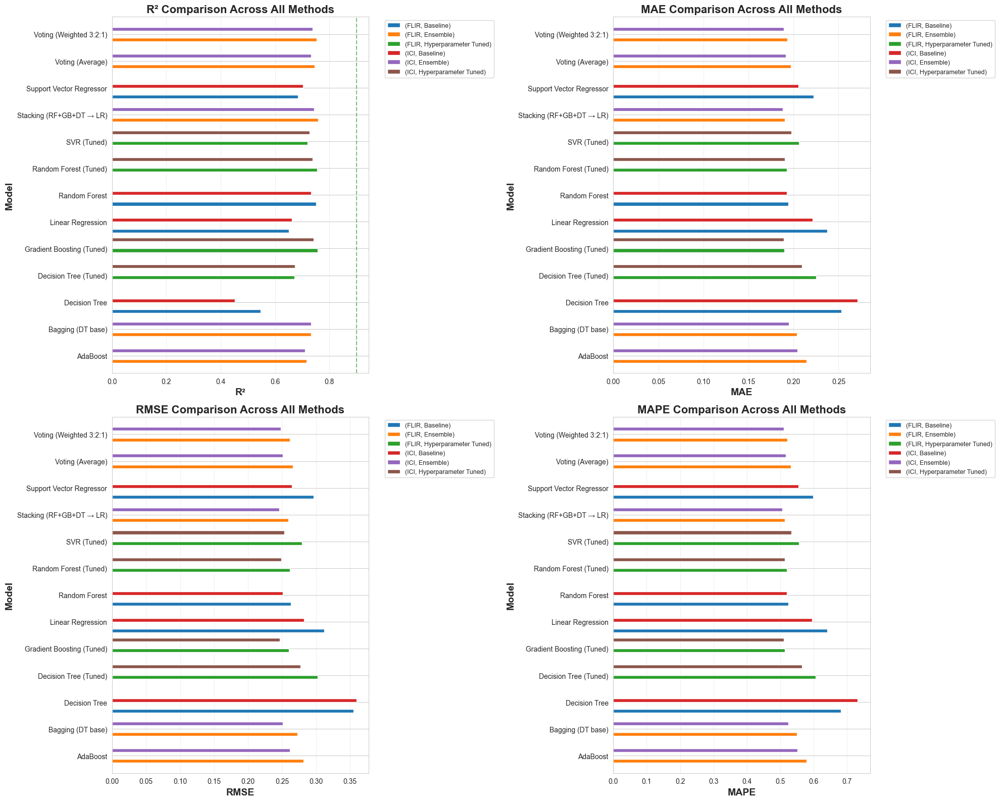

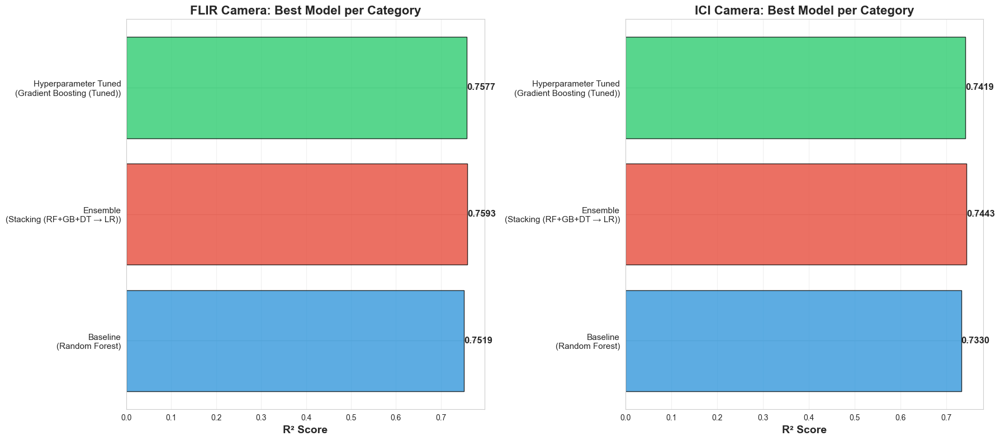

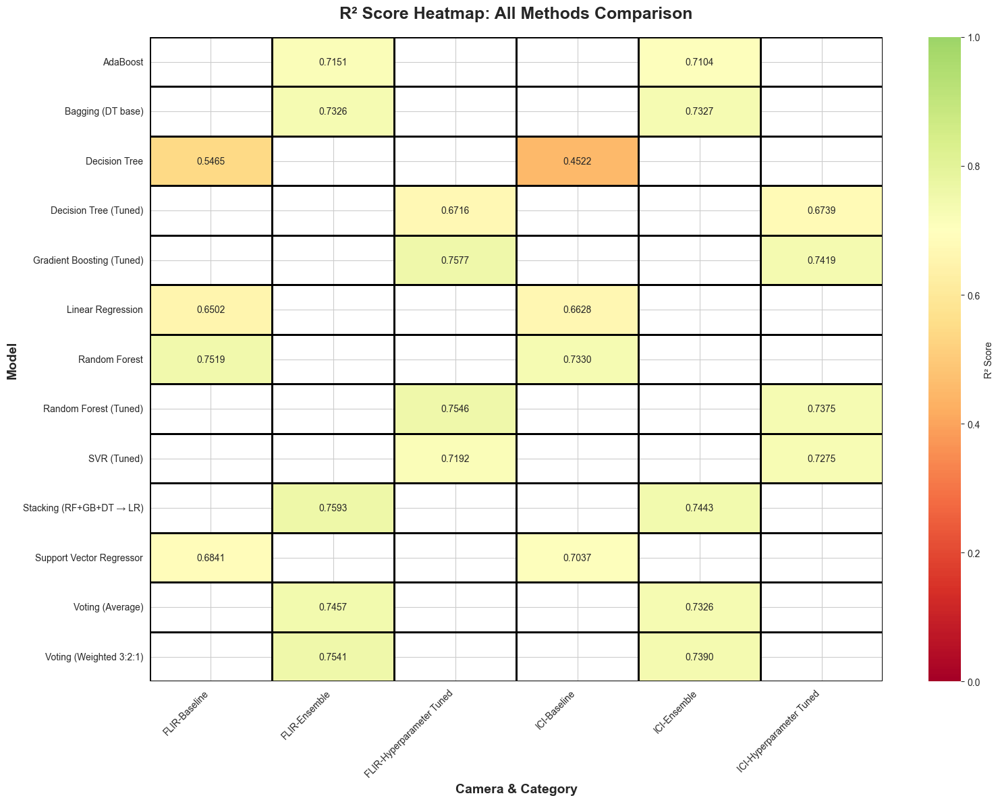

In [104]:
# Comprehensive visualization
def plot_comprehensive_comparison(df):
    """
    Create comprehensive visualizations comparing all approaches
    """
    # 1. Performance by Category
    fig, axes = plt.subplots(2, 2, figsize=(20, 16))
    
    metrics = ['R²', 'MAE', 'RMSE', 'MAPE']
    
    for idx, metric in enumerate(metrics):
        ax = axes[idx // 2, idx % 2]
        
        # Group by camera and category
        pivot_data = df.pivot_table(
            values=metric,
            index='Model',
            columns=['Camera', 'Category'],
            aggfunc='mean'
        )
        
        pivot_data.plot(kind='barh', ax=ax, width=0.8)
        
        ax.set_xlabel(metric, fontsize=14, fontweight='bold')
        ax.set_ylabel('Model', fontsize=14, fontweight='bold')
        ax.set_title(f'{metric} Comparison Across All Methods', fontsize=16, fontweight='bold')
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
        ax.grid(True, alpha=0.3, axis='x')
        
        # Add vertical line for reference
        if metric == 'R²':
            ax.axvline(x=0.9, color='green', linestyle='--', alpha=0.5, label='Excellent (0.9)')
    
    plt.tight_layout()
    plt.savefig('comprehensive_comparison_all_methods.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # 2. Best Model per Category
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))
    
    for idx, cam in enumerate(['FLIR', 'ICI']):
        ax = axes[idx]
        cam_data = df[df['Camera'] == cam]
        
        # Get best model from each category
        best_by_category = cam_data.loc[cam_data.groupby('Category')['R²'].idxmax()]
        
        categories = best_by_category['Category'].values
        r2_scores = best_by_category['R²'].values
        model_names_best = best_by_category['Model'].values
        
        colors_cat = ['#3498db', '#e74c3c', '#2ecc71']
        bars = ax.barh(range(len(categories)), r2_scores, color=colors_cat, alpha=0.8, edgecolor='black')
        
        ax.set_yticks(range(len(categories)))
        ax.set_yticklabels([f"{cat}\n({model})" for cat, model in zip(categories, model_names_best)], 
                          fontsize=11)
        ax.set_xlabel('R² Score', fontsize=14, fontweight='bold')
        ax.set_title(f'{cam} Camera: Best Model per Category', fontsize=16, fontweight='bold')
        ax.grid(True, alpha=0.3, axis='x')
        
        # Add value labels
        for i, (bar, val) in enumerate(zip(bars, r2_scores)):
            ax.text(val, bar.get_y() + bar.get_height()/2, 
                   f'{val:.4f}', ha='left', va='center', fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig('best_models_by_category.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # 3. Heatmap of R² scores
    plt.figure(figsize=(16, 12))
    pivot_heatmap = df.pivot_table(
        values='R²',
        index='Model',
        columns=['Camera', 'Category'],
        aggfunc='mean'
    )
    
    sns.heatmap(pivot_heatmap, annot=True, fmt='.4f', cmap='RdYlGn', 
               center=0.7, vmin=0, vmax=1, linewidths=1, linecolor='black',
               cbar_kws={'label': 'R² Score'})
    plt.title('R² Score Heatmap: All Methods Comparison', fontsize=18, fontweight='bold', pad=20)
    plt.ylabel('Model', fontsize=14, fontweight='bold')
    plt.xlabel('Camera & Category', fontsize=14, fontweight='bold')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig('r2_heatmap_all_methods.png', dpi=300, bbox_inches='tight')
    plt.show()

# Generate visualizations
plot_comprehensive_comparison(comprehensive_df)

In [105]:
# Final comprehensive report
def generate_final_report(df):
    """
    Generate final comprehensive report with all methods
    """
    print("\n" + "="*120)
    print(" " * 40 + "FINAL COMPREHENSIVE REPORT")
    print("="*120)
    
    # Overall best models
    print("\n1. OVERALL BEST MODELS (by R²):")
    print("-" * 120)
    top_10 = df.nlargest(10, 'R²')[['Camera', 'Category', 'Model', 'R²', 'MAE', 'RMSE', 'MAPE']]
    for idx, (_, row) in enumerate(top_10.iterrows(), 1):
        print(f"{idx:2d}. {row['Camera']:<6} | {row['Category']:<25} | {row['Model']:<35} | "
              f"R²={row['R²']:.4f} | MAE={row['MAE']:.4f} | MAPE={row['MAPE']:.2f}%")
    
    # Best by category
    print("\n2. BEST MODELS BY CATEGORY:")
    print("-" * 120)
    for category in df['Category'].unique():
        print(f"\n{category}:")
        cat_data = df[df['Category'] == category]
        best = cat_data.loc[cat_data['R²'].idxmax()]
        print(f"  Camera: {best['Camera']:<6} | Model: {best['Model']:<35} | "
              f"R²={best['R²']:.4f} | MAPE={best['MAPE']:.2f}%")
    
    # Category comparison
    print("\n3. AVERAGE PERFORMANCE BY CATEGORY:")
    print("-" * 120)
    category_stats = df.groupby('Category')[['R²', 'MAE', 'RMSE', 'MAPE']].agg(['mean', 'std'])
    print(category_stats)
    
    # Camera comparison
    print("\n4. CAMERA COMPARISON (BEST MODELS):")
    print("-" * 120)
    for cam in ['FLIR', 'ICI']:
        cam_data = df[df['Camera'] == cam]
        best = cam_data.loc[cam_data['R²'].idxmax()]
        print(f"\n{cam} Camera Best:")
        print(f"  Category: {best['Category']}")
        print(f"  Model: {best['Model']}")
        print(f"  R²: {best['R²']:.4f}")
        print(f"  MAE: {best['MAE']:.4f}°C")
        print(f"  RMSE: {best['RMSE']:.4f}°C")
        print(f"  MAPE: {best['MAPE']:.2f}%")
        if best['Training_Time'] != 'N/A':
            print(f"  Training Time: {best['Training_Time']}")
    
    # Improvement analysis
    print("\n5. IMPROVEMENT ANALYSIS:")
    print("-" * 120)
    for cam in ['FLIR', 'ICI']:
        baseline_best = df[(df['Camera'] == cam) & (df['Category'] == 'Baseline')]['R²'].max()
        tuned_best = df[(df['Camera'] == cam) & (df['Category'] == 'Hyperparameter Tuned')]['R²'].max()
        ensemble_best = df[(df['Camera'] == cam) & (df['Category'] == 'Ensemble')]['R²'].max()
        
        print(f"\n{cam} Camera:")
        print(f"  Baseline → Tuned:    {((tuned_best - baseline_best) / baseline_best * 100):+.2f}% improvement")
        print(f"  Baseline → Ensemble: {((ensemble_best - baseline_best) / baseline_best * 100):+.2f}% improvement")
        print(f"  Tuned → Ensemble:    {((ensemble_best - tuned_best) / tuned_best * 100):+.2f}% improvement")
    
    print("\n" + "="*120)

# Generate final report
generate_final_report(comprehensive_df)

print("\nComplete analysis finished!")
print("\nGenerated Files:")
print("   - comprehensive_model_comparison.csv")
print("   - comprehensive_comparison_all_methods.png")
print("   - best_models_by_category.png")
print("   - r2_heatmap_all_methods.png")


                                        FINAL COMPREHENSIVE REPORT

1. OVERALL BEST MODELS (by R²):
------------------------------------------------------------------------------------------------------------------------
 1. FLIR   | Ensemble                  | Stacking (RF+GB+DT → LR)            | R²=0.7593 | MAE=0.1901 | MAPE=0.51%
 2. FLIR   | Hyperparameter Tuned      | Gradient Boosting (Tuned)           | R²=0.7577 | MAE=0.1900 | MAPE=0.51%
 3. FLIR   | Hyperparameter Tuned      | Random Forest (Tuned)               | R²=0.7546 | MAE=0.1927 | MAPE=0.52%
 4. FLIR   | Ensemble                  | Voting (Weighted 3:2:1)             | R²=0.7541 | MAE=0.1932 | MAPE=0.52%
 5. FLIR   | Baseline                  | Random Forest                       | R²=0.7519 | MAE=0.1940 | MAPE=0.52%
 6. FLIR   | Ensemble                  | Voting (Average)                    | R²=0.7457 | MAE=0.1972 | MAPE=0.53%
 7. ICI    | Ensemble                  | Stacking (RF+GB+DT → LR)            | R²=0.7443

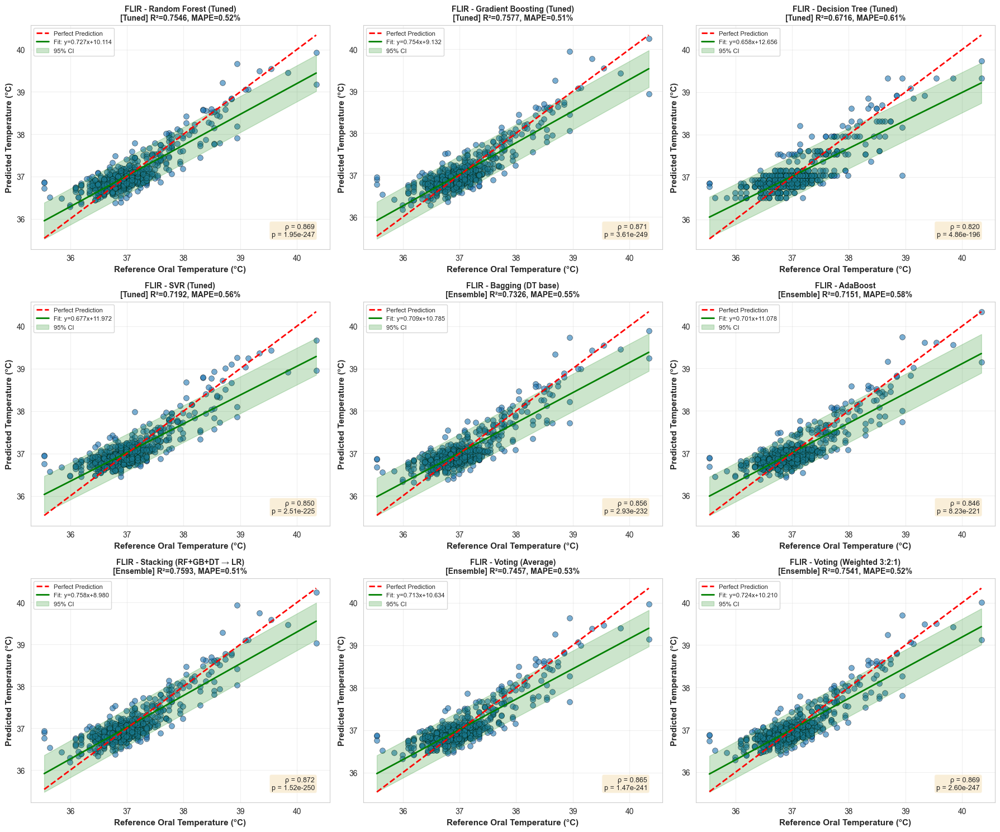

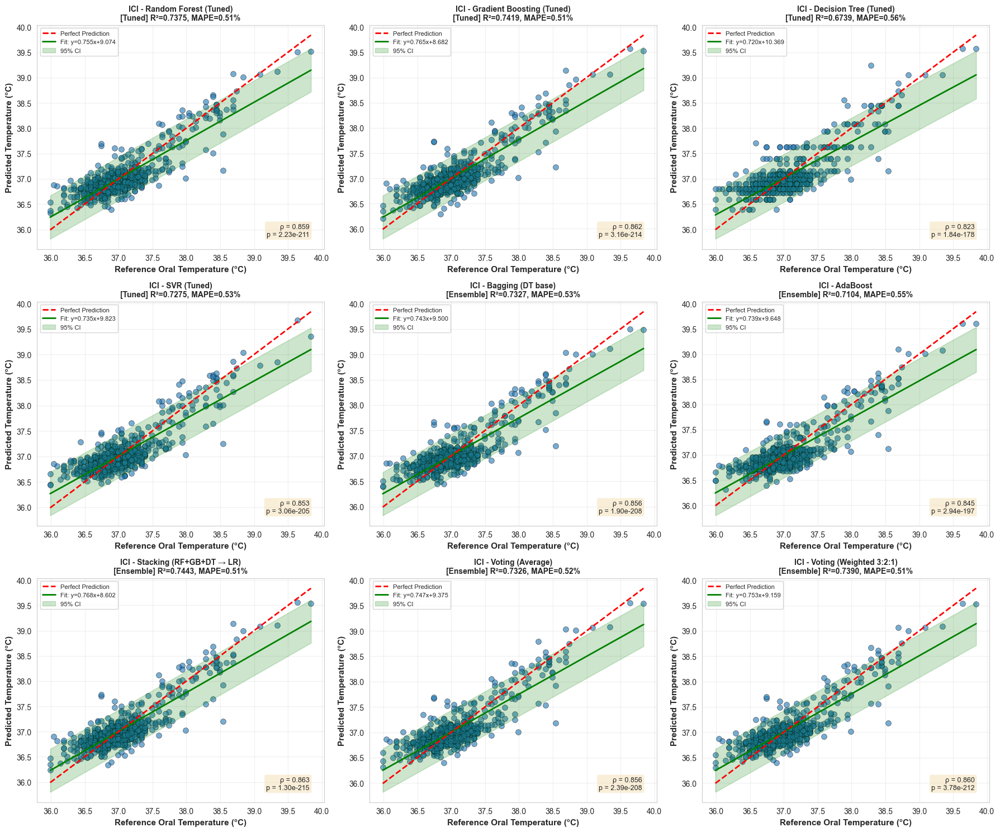

In [106]:
# Comprehensive Visualization for Tuned and Ensemble Models

# 1. Calibration Scatter Plots for All Models
def plot_all_calibration_curves(tuned_models_storage, ensemble_models_storage, cameras):
    """
    Create calibration scatter plots for tuned and ensemble models
    """
    for cam in cameras.keys():
        y_test = tuned_models_storage[cam]['y_test']
        
        # Combine tuned and ensemble models
        all_models = []
        
        # Add tuned models
        for tuned in tuned_models_storage[cam]['tuned_models']:
            all_models.append({
                'name': tuned['Model'],
                'y_pred': tuned['y_pred'],
                'category': 'Tuned'
            })
        
        # Add ensemble models
        for ensemble in ensemble_models_storage[cam]:
            all_models.append({
                'name': ensemble['Model'],
                'y_pred': ensemble['y_pred'],
                'category': 'Ensemble'
            })
        
        # Create subplots (4x3 grid to accommodate all models)
        n_models = len(all_models)
        n_cols = 3
        n_rows = (n_models + n_cols - 1) // n_cols
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
        axes = axes.flatten() if n_rows > 1 else [axes] if n_cols == 1 else axes
        
        for idx, model_info in enumerate(all_models):
            ax = axes[idx]
            y_pred = model_info['y_pred']
            
            # Calculate metrics
            from scipy import stats as sp_stats
            mae = mean_absolute_error(y_test, y_pred)
            r2 = 1 - (np.sum((y_test - y_pred)**2) / np.sum((y_test - y_test.mean())**2))
            mape = calculate_mape(y_test, y_pred)
            
            # Scatter plot
            ax.scatter(y_test, y_pred, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
            
            # Perfect prediction line (y=x)
            min_val = min(y_test.min(), y_pred.min())
            max_val = max(y_test.max(), y_pred.max())
            ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, 
                   label='Perfect Prediction', zorder=10)
            
            # Regression line with confidence interval
            slope, intercept, r_value, p_value, std_err = sp_stats.linregress(y_test, y_pred)
            line = slope * np.array(y_test) + intercept
            
            # Sort for proper plotting
            sorted_indices = np.argsort(y_test)
            y_test_sorted = np.array(y_test)[sorted_indices]
            line_sorted = line[sorted_indices]
            
            ax.plot(y_test_sorted, line_sorted, 'g-', lw=2, 
                   label=f'Fit: y={slope:.3f}x+{intercept:.3f}')
            
            # Calculate 95% confidence interval
            predict_error = y_pred - line
            predict_std = np.std(predict_error)
            confidence_interval = 1.96 * predict_std
            
            ax.fill_between(y_test_sorted, 
                          line_sorted - confidence_interval,
                          line_sorted + confidence_interval,
                          alpha=0.2, color='green', label='95% CI')
            
            # Labels and title
            ax.set_xlabel('Reference Oral Temperature (°C)', fontsize=11, fontweight='bold')
            ax.set_ylabel('Predicted Temperature (°C)', fontsize=11, fontweight='bold')
            ax.set_title(f'{cam} - {model_info["name"]}\n[{model_info["category"]}] R²={r2:.4f}, MAPE={mape:.2f}%', 
                        fontsize=10, fontweight='bold')
            ax.legend(loc='upper left', fontsize=8)
            ax.grid(True, alpha=0.3)
            
            # Add correlation text
            ax.text(0.95, 0.05, f'ρ = {r_value:.3f}\np = {p_value:.2e}',
                   transform=ax.transAxes, fontsize=9,
                   verticalalignment='bottom', horizontalalignment='right',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
        
        # Hide empty subplots
        for idx in range(len(all_models), len(axes)):
            axes[idx].set_visible(False)
        
        plt.tight_layout()
        plt.savefig(f'{cam}_all_models_calibration_curves.png', dpi=300, bbox_inches='tight')
        plt.show()

# Generate calibration plots for all models
plot_all_calibration_curves(tuned_models_storage, ensemble_models_storage, cameras)

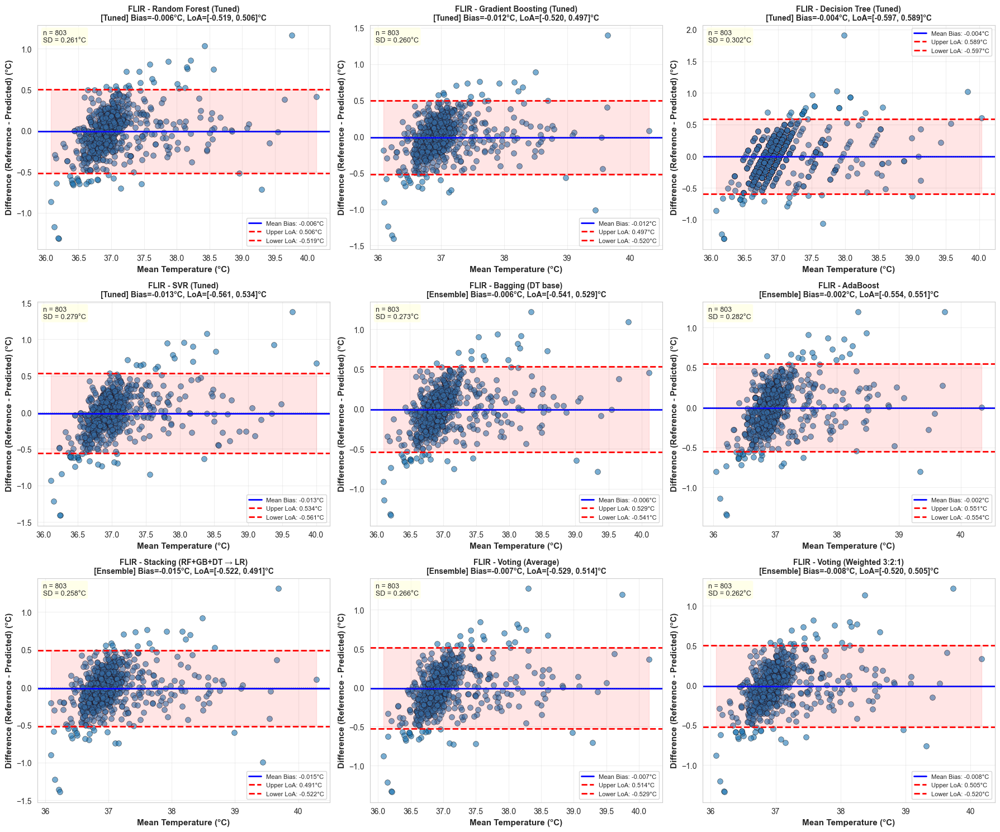

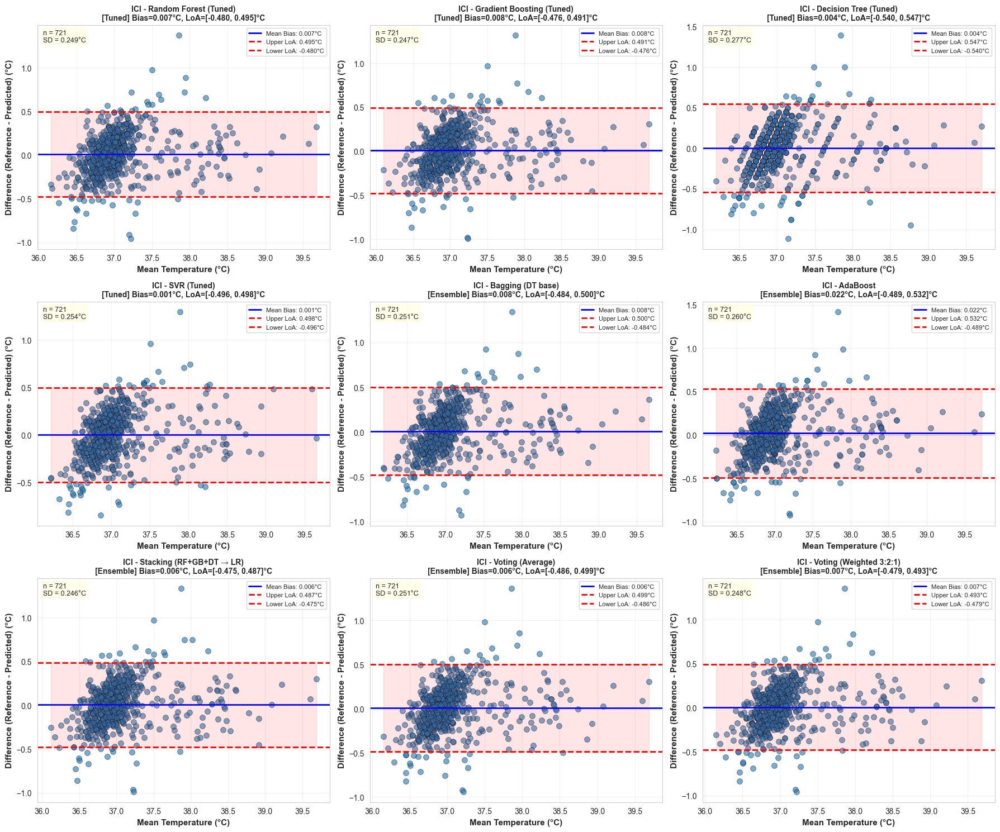

In [107]:
# 2. Bland-Altman Plots for All Models
def plot_all_bland_altman(tuned_models_storage, ensemble_models_storage, cameras):
    """
    Create Bland-Altman plots for tuned and ensemble models
    """
    for cam in cameras.keys():
        y_test = tuned_models_storage[cam]['y_test']
        
        # Combine tuned and ensemble models
        all_models = []
        
        # Add tuned models
        for tuned in tuned_models_storage[cam]['tuned_models']:
            all_models.append({
                'name': tuned['Model'],
                'y_pred': tuned['y_pred'],
                'category': 'Tuned'
            })
        
        # Add ensemble models
        for ensemble in ensemble_models_storage[cam]:
            all_models.append({
                'name': ensemble['Model'],
                'y_pred': ensemble['y_pred'],
                'category': 'Ensemble'
            })
        
        # Create subplots
        n_models = len(all_models)
        n_cols = 3
        n_rows = (n_models + n_cols - 1) // n_cols
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
        axes = axes.flatten() if n_rows > 1 else [axes] if n_cols == 1 else axes
        
        for idx, model_info in enumerate(all_models):
            ax = axes[idx]
            y_pred = model_info['y_pred']
            
            # Calculate mean and difference
            mean_temp = (np.array(y_test) + np.array(y_pred)) / 2
            diff = np.array(y_test) - np.array(y_pred)
            
            mean_diff = np.mean(diff)
            std_diff = np.std(diff)
            
            # Scatter plot
            ax.scatter(mean_temp, diff, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
            
            # Mean bias line
            ax.axhline(mean_diff, color='blue', linestyle='-', lw=2, 
                      label=f'Mean Bias: {mean_diff:.3f}°C')
            
            # Limits of agreement (±1.96 SD)
            upper_loa = mean_diff + 1.96 * std_diff
            lower_loa = mean_diff - 1.96 * std_diff
            
            ax.axhline(upper_loa, color='red', linestyle='--', lw=2, 
                      label=f'Upper LoA: {upper_loa:.3f}°C')
            ax.axhline(lower_loa, color='red', linestyle='--', lw=2, 
                      label=f'Lower LoA: {lower_loa:.3f}°C')
            
            # Shaded region between limits
            ax.fill_between([mean_temp.min(), mean_temp.max()], 
                          lower_loa, upper_loa, alpha=0.1, color='red')
            
            # Zero line
            ax.axhline(0, color='gray', linestyle=':', lw=1, alpha=0.5)
            
            # Labels
            ax.set_xlabel('Mean Temperature (°C)', fontsize=11, fontweight='bold')
            ax.set_ylabel('Difference (Reference - Predicted) (°C)', fontsize=11, fontweight='bold')
            ax.set_title(f'{cam} - {model_info["name"]}\n[{model_info["category"]}] Bias={mean_diff:.3f}°C, LoA=[{lower_loa:.3f}, {upper_loa:.3f}]°C',
                        fontsize=10, fontweight='bold')
            ax.legend(loc='best', fontsize=8)
            ax.grid(True, alpha=0.3)
            
            # Add statistics box
            stats_text = f'n = {len(diff)}\nSD = {std_diff:.3f}°C'
            ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, 
                   fontsize=9, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.7))
        
        # Hide empty subplots
        for idx in range(len(all_models), len(axes)):
            axes[idx].set_visible(False)
        
        plt.tight_layout()
        plt.savefig(f'{cam}_all_models_bland_altman.png', dpi=300, bbox_inches='tight')
        plt.show()

# Generate Bland-Altman plots for all models
plot_all_bland_altman(tuned_models_storage, ensemble_models_storage, cameras)

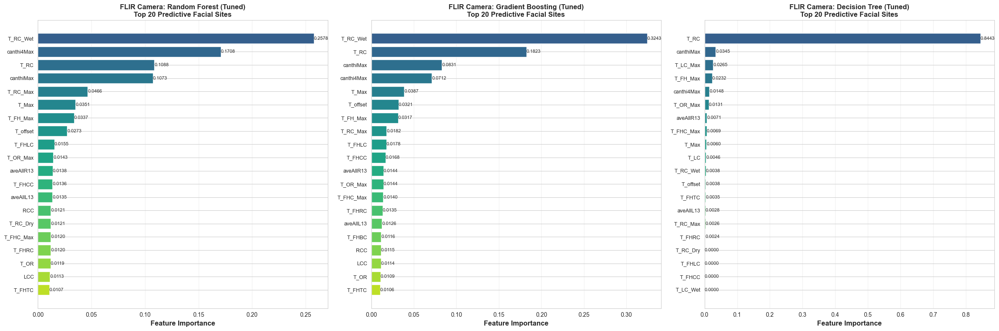

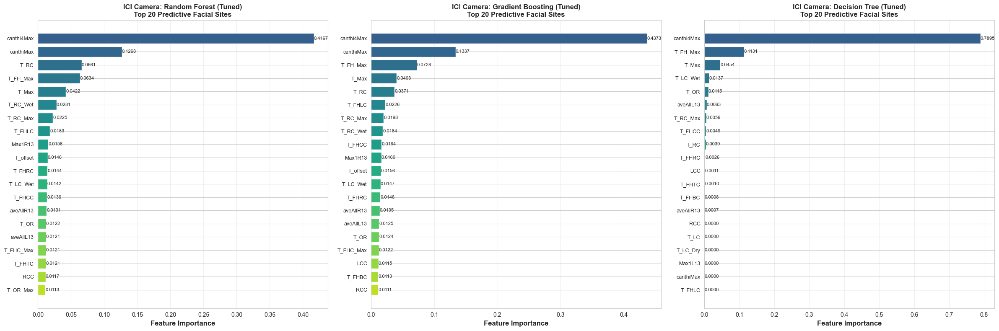

In [108]:
# 3. Feature Importance for Tuned Tree-Based Models
def plot_tuned_feature_importance(tuned_models_storage, cameras):
    """
    Plot feature importance for tuned tree-based models
    """
    for cam in cameras.keys():
        feature_names = tuned_models_storage[cam]['X_test'].columns
        
        # Get tree-based models
        tree_models = []
        for tuned in tuned_models_storage[cam]['tuned_models']:
            if any(x in tuned['Model'] for x in ['Random Forest', 'Decision Tree', 'Gradient Boosting']):
                tree_models.append(tuned)
        
        if not tree_models:
            continue
        
        # Create subplots
        n_models = len(tree_models)
        fig, axes = plt.subplots(1, n_models, figsize=(8*n_models, 8))
        if n_models == 1:
            axes = [axes]
        
        for idx, tuned_model in enumerate(tree_models):
            ax = axes[idx]
            model = tuned_model['model']
            
            # Get feature importances
            importances = model.feature_importances_
            
            # Sort features by importance
            indices = np.argsort(importances)[::-1][:20]  # Top 20 features
            
            # Create DataFrame for plotting
            importance_df = pd.DataFrame({
                'Feature': [feature_names[i] for i in indices],
                'Importance': importances[indices]
            })
            
            # Horizontal bar plot
            colors = plt.cm.viridis(np.linspace(0.3, 0.9, len(indices)))
            bars = ax.barh(range(len(indices)), importance_df['Importance'], color=colors)
            
            ax.set_yticks(range(len(indices)))
            ax.set_yticklabels(importance_df['Feature'], fontsize=9)
            ax.set_xlabel('Feature Importance', fontsize=12, fontweight='bold')
            ax.set_title(f'{cam} Camera: {tuned_model["Model"]}\nTop 20 Predictive Facial Sites', 
                        fontsize=12, fontweight='bold')
            ax.invert_yaxis()
            ax.grid(True, alpha=0.3, axis='x')
            
            # Add value labels on bars
            for i, bar in enumerate(bars):
                width = bar.get_width()
                ax.text(width, bar.get_y() + bar.get_height()/2, 
                       f'{width:.4f}', ha='left', va='center', fontsize=8)
        
        plt.tight_layout()
        plt.savefig(f'{cam}_tuned_feature_importance.png', dpi=300, bbox_inches='tight')
        plt.show()

# Generate feature importance plots
plot_tuned_feature_importance(tuned_models_storage, cameras)

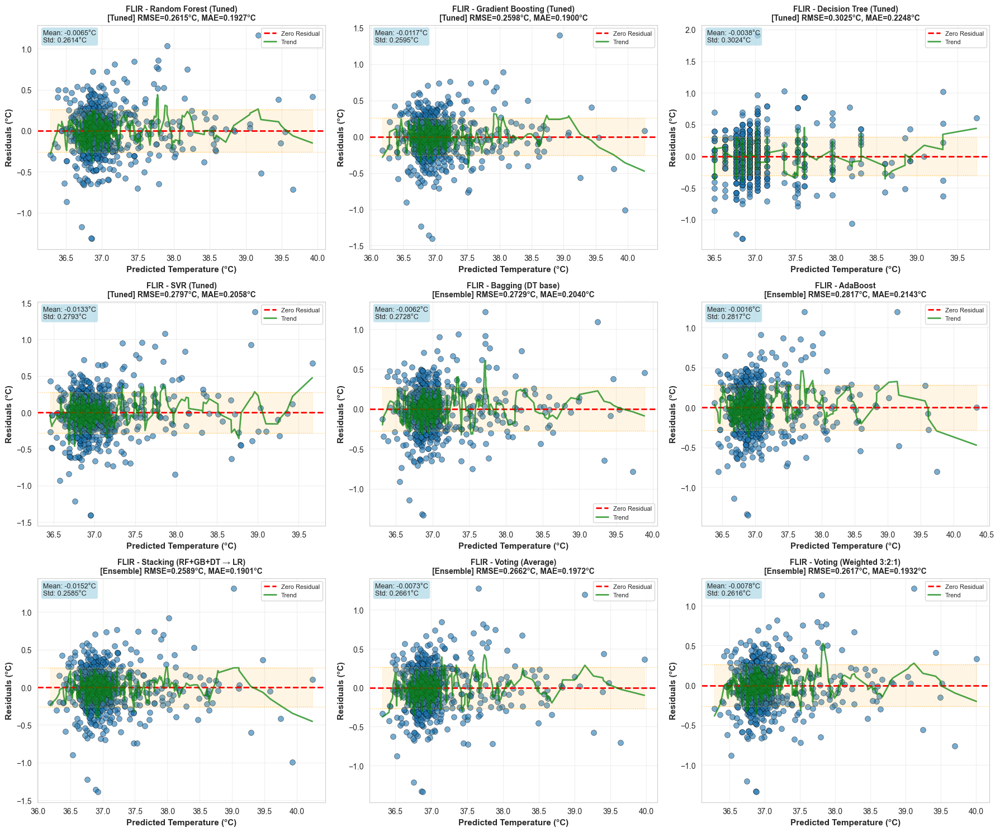

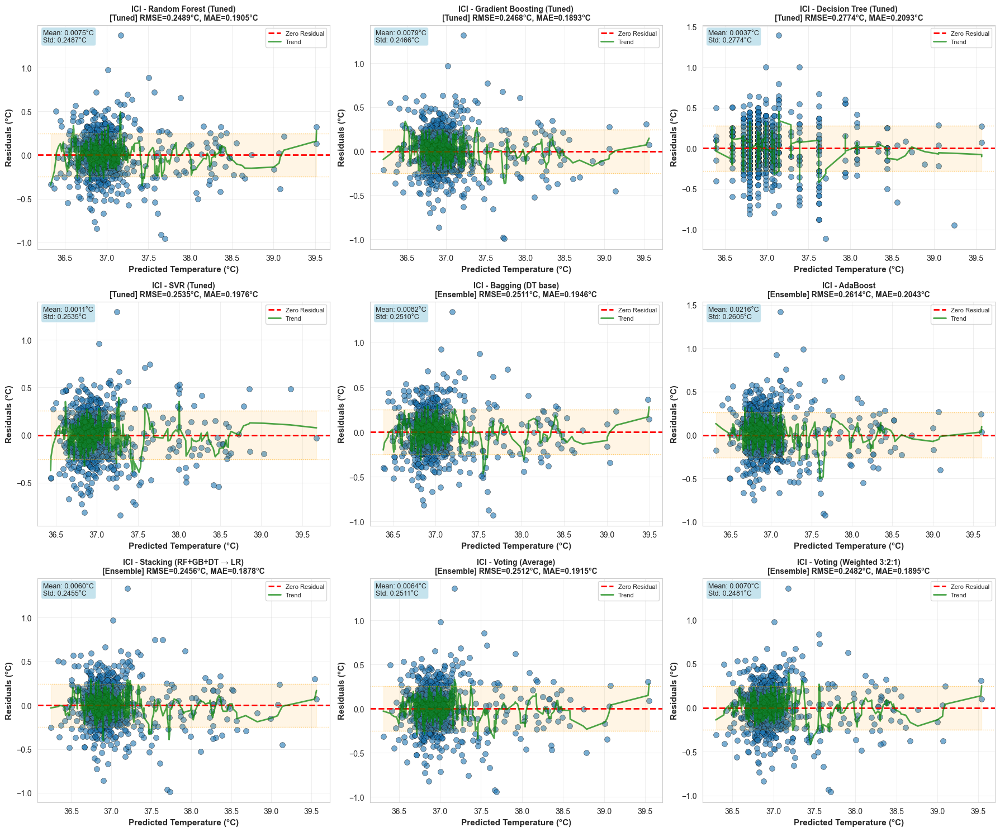

In [109]:
# 4. Residual Plots for All Models
def plot_all_residuals(tuned_models_storage, ensemble_models_storage, cameras):
    """
    Create residual plots for tuned and ensemble models
    """
    for cam in cameras.keys():
        y_test = tuned_models_storage[cam]['y_test']
        
        # Combine tuned and ensemble models
        all_models = []
        
        # Add tuned models
        for tuned in tuned_models_storage[cam]['tuned_models']:
            all_models.append({
                'name': tuned['Model'],
                'y_pred': tuned['y_pred'],
                'category': 'Tuned'
            })
        
        # Add ensemble models
        for ensemble in ensemble_models_storage[cam]:
            all_models.append({
                'name': ensemble['Model'],
                'y_pred': ensemble['y_pred'],
                'category': 'Ensemble'
            })
        
        # Create subplots
        n_models = len(all_models)
        n_cols = 3
        n_rows = (n_models + n_cols - 1) // n_cols
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
        axes = axes.flatten() if n_rows > 1 else [axes] if n_cols == 1 else axes
        
        for idx, model_info in enumerate(all_models):
            ax = axes[idx]
            y_pred = model_info['y_pred']
            residuals = np.array(y_test) - np.array(y_pred)
            
            # Scatter plot of residuals
            ax.scatter(y_pred, residuals, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
            
            # Zero line
            ax.axhline(0, color='red', linestyle='--', lw=2, label='Zero Residual')
            
            # Add smoothed trend line
            from scipy.signal import savgol_filter
            sorted_indices = np.argsort(y_pred)
            y_pred_sorted = np.array(y_pred)[sorted_indices]
            residuals_sorted = residuals[sorted_indices]
            
            # Apply Savitzky-Golay filter for smooth trend
            if len(residuals_sorted) > 11:
                trend = savgol_filter(residuals_sorted, window_length=11, polyorder=2)
                ax.plot(y_pred_sorted, trend, 'g-', lw=2, label='Trend', alpha=0.7)
            
            # Calculate residual statistics
            rmse = np.sqrt(np.mean(residuals**2))
            mae = np.mean(np.abs(residuals))
            
            # Labels
            ax.set_xlabel('Predicted Temperature (°C)', fontsize=11, fontweight='bold')
            ax.set_ylabel('Residuals (°C)', fontsize=11, fontweight='bold')
            ax.set_title(f'{cam} - {model_info["name"]}\n[{model_info["category"]}] RMSE={rmse:.4f}°C, MAE={mae:.4f}°C',
                        fontsize=10, fontweight='bold')
            ax.legend(loc='best', fontsize=8)
            ax.grid(True, alpha=0.3)
            
            # Add standard deviation bands
            std_residuals = np.std(residuals)
            ax.axhline(std_residuals, color='orange', linestyle=':', lw=1, alpha=0.5)
            ax.axhline(-std_residuals, color='orange', linestyle=':', lw=1, alpha=0.5)
            ax.fill_between([y_pred.min(), y_pred.max()], 
                          -std_residuals, std_residuals, alpha=0.1, color='orange')
            
            # Statistics box
            stats_text = f'Mean: {np.mean(residuals):.4f}°C\nStd: {std_residuals:.4f}°C'
            ax.text(0.02, 0.98, stats_text, transform=ax.transAxes,
                   fontsize=9, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.7))
        
        # Hide empty subplots
        for idx in range(len(all_models), len(axes)):
            axes[idx].set_visible(False)
        
        plt.tight_layout()
        plt.savefig(f'{cam}_all_models_residual_plots.png', dpi=300, bbox_inches='tight')
        plt.show()

# Generate residual plots for all models
plot_all_residuals(tuned_models_storage, ensemble_models_storage, cameras)

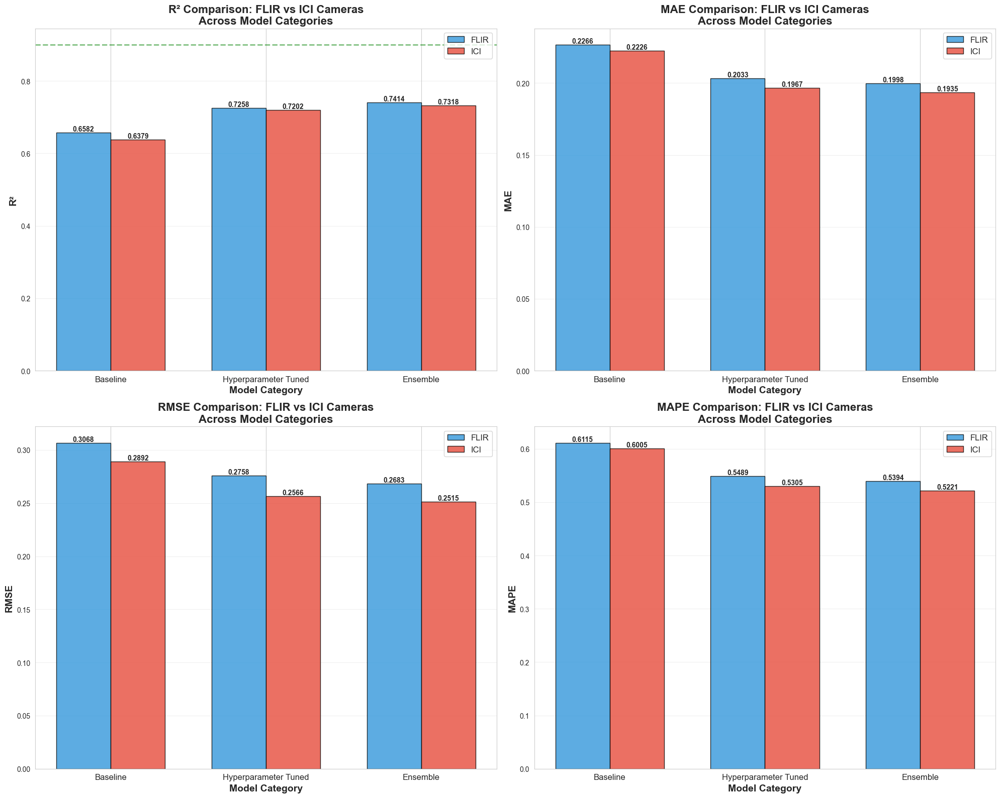

In [110]:
# 5. Enhanced Bar Charts Comparing Metrics Between Cameras
def plot_enhanced_camera_comparison(comprehensive_df):
    """
    Create enhanced bar charts comparing key metrics between cameras
    """
    # Create figure with subplots for each metric
    fig, axes = plt.subplots(2, 2, figsize=(20, 16))
    axes = axes.flatten()
    
    metrics = ['R²', 'MAE', 'RMSE', 'MAPE']
    colors_camera = {'FLIR': '#3498db', 'ICI': '#e74c3c'}
    
    for idx, metric in enumerate(metrics):
        ax = axes[idx]
        
        # Get data grouped by category and camera
        data_by_category = {}
        for category in comprehensive_df['Category'].unique():
            category_data = comprehensive_df[comprehensive_df['Category'] == category]
            flir_values = category_data[category_data['Camera'] == 'FLIR'][metric].values
            ici_values = category_data[category_data['Camera'] == 'ICI'][metric].values
            
            data_by_category[category] = {
                'FLIR': flir_values,
                'ICI': ici_values
            }
        
        # Create grouped bar chart
        categories = list(data_by_category.keys())
        x = np.arange(len(categories))
        width = 0.35
        
        # Calculate means for each category and camera
        flir_means = [np.mean(data_by_category[cat]['FLIR']) for cat in categories]
        ici_means = [np.mean(data_by_category[cat]['ICI']) for cat in categories]
        
        # Plot bars
        bars1 = ax.bar(x - width/2, flir_means, width, label='FLIR', 
                      color=colors_camera['FLIR'], alpha=0.8, edgecolor='black')
        bars2 = ax.bar(x + width/2, ici_means, width, label='ICI', 
                      color=colors_camera['ICI'], alpha=0.8, edgecolor='black')
        
        # Add value labels on bars
        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.4f}',
                       ha='center', va='bottom', fontsize=10, fontweight='bold')
        
        ax.set_xlabel('Model Category', fontsize=14, fontweight='bold')
        ax.set_ylabel(metric, fontsize=14, fontweight='bold')
        ax.set_title(f'{metric} Comparison: FLIR vs ICI Cameras\nAcross Model Categories', 
                    fontsize=16, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(categories, fontsize=12)
        ax.legend(fontsize=12)
        ax.grid(True, alpha=0.3, axis='y')
        
        # Add reference line for R²
        if metric == 'R²':
            ax.axhline(y=0.9, color='green', linestyle='--', linewidth=2, 
                      alpha=0.5, label='Excellent (0.9)')
    
    plt.tight_layout()
    plt.savefig('enhanced_camera_comparison_by_category.png', dpi=300, bbox_inches='tight')
    plt.show()

# Generate enhanced comparison
plot_enhanced_camera_comparison(comprehensive_df)

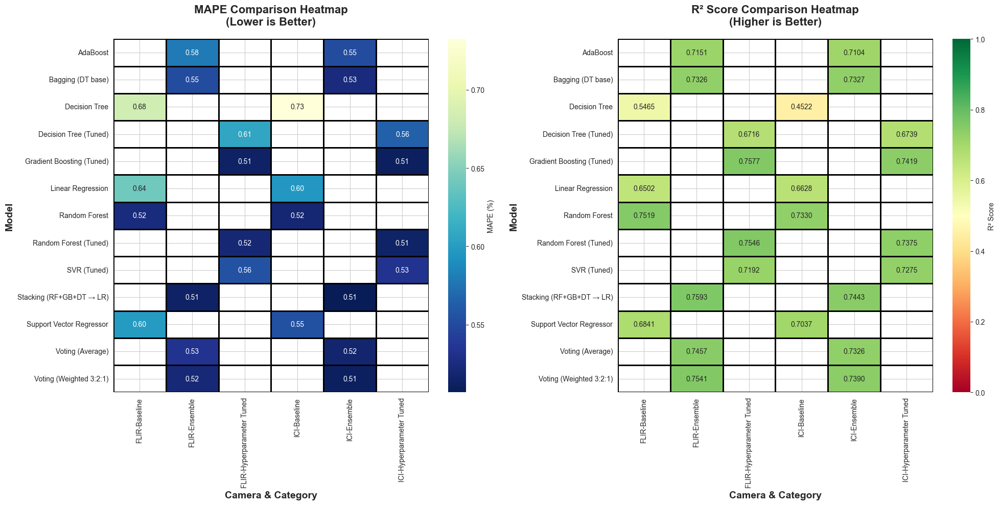


DETAILED MAPE AND R² COMPARISON BY CAMERA AND CATEGORY
                                 MAPE                                      R²  \
                                 mean       min       max       std      mean   
Camera Category                                                                 
FLIR   Baseline              0.611473  0.523835  0.682372  0.067631  0.658210   
       Ensemble              0.539369  0.513449  0.578500  0.025987  0.741368   
       Hyperparameter Tuned  0.548884  0.513261  0.606440  0.042610  0.725776   
ICI    Baseline              0.600510  0.519168  0.732406  0.093367  0.637923   
       Ensemble              0.522096  0.506763  0.550951  0.017510  0.731798   
       Hyperparameter Tuned  0.530545  0.510571  0.564738  0.024831  0.720204   

                                                           
                                  min       max       std  
Camera Category                                            
FLIR   Baseline              0.546

In [112]:
# 6. Detailed Metric Comparison Table and Visualization
def create_detailed_metric_comparison(comprehensive_df):
    """
    Create detailed comparison of MAPE and R² with visual indicators
    """
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    
    # MAPE Comparison
    ax1 = axes[0]
    pivot_mape = comprehensive_df.pivot_table(
        values='MAPE',
        index='Model',
        columns=['Camera', 'Category'],
        aggfunc='mean'
    )
    
    sns.heatmap(pivot_mape, annot=True, fmt='.2f', cmap='YlGnBu_r', 
               ax=ax1, cbar_kws={'label': 'MAPE (%)'}, 
               linewidths=1, linecolor='black')
    ax1.set_title('MAPE Comparison Heatmap\n(Lower is Better)', 
                 fontsize=16, fontweight='bold', pad=20)
    ax1.set_xlabel('Camera & Category', fontsize=14, fontweight='bold')
    ax1.set_ylabel('Model', fontsize=14, fontweight='bold')
    
    # R² Comparison
    ax2 = axes[1]
    pivot_r2 = comprehensive_df.pivot_table(
        values='R²',
        index='Model',
        columns=['Camera', 'Category'],
        aggfunc='mean'
    )
    
    sns.heatmap(pivot_r2, annot=True, fmt='.4f', cmap='RdYlGn', 
               ax=ax2, cbar_kws={'label': 'R² Score'}, 
               vmin=0, vmax=1, linewidths=1, linecolor='black')
    ax2.set_title('R² Score Comparison Heatmap\n(Higher is Better)', 
                 fontsize=16, fontweight='bold', pad=20)
    ax2.set_xlabel('Camera & Category', fontsize=14, fontweight='bold')
    ax2.set_ylabel('Model', fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig('detailed_mape_r2_comparison_heatmaps.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Print detailed comparison table
    print("\n" + "="*120)
    print("DETAILED MAPE AND R² COMPARISON BY CAMERA AND CATEGORY")
    print("="*120)
    
    summary = comprehensive_df.groupby(['Camera', 'Category'])[['MAPE', 'R²']].agg(['mean', 'min', 'max', 'std'])
    print(summary)
    print("="*120)

# Generate detailed metric comparison
create_detailed_metric_comparison(comprehensive_df)